#Age detection



##Importing and global variables

In [1]:
import subprocess
# run commands like installing packages or file system manipulation
def run_command(cmd):
  cmd += ' 2>> err.txt 1>> out.txt'
  subprocess.call(cmd, shell=True)
if __name__ == '__main__':
  # install packages
  print("Installing packages")
  run_command("apt-get update")
  run_command("apt-get install ffmpeg libsm6 libxext6 unzip unrar -y")
  run_command("pip install pytorch-lightning facenet-pytorch boto3 requests pandas numpy scikit-learn matplotlib torch tensorboard seaborn plotly albumentations patool")

Installing packages


In [2]:
# import packages
if __name__ == '__main__':
  print("Importing packages")
import os
import glob
import sys
import itertools
import zipfile
import statistics
import collections
import csv
import time
import math
import warnings
import random
from datetime import datetime
from argparse import ArgumentParser, ArgumentDefaultsHelpFormatter

import pandas as pd
import numpy as np
import torch
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sn
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import albumentations as A
from torchvision import utils, models as models, transforms as T
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, classification_report
from pytorch_lightning.loggers import TensorBoardLogger
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping, StochasticWeightAveraging
from torchvision.models import resnet50, resnet152, vgg16, densenet121, densenet201, efficientnet_v2_s, efficientnet_v2_m, efficientnet_v2_l
from facenet_pytorch import InceptionResnetV1

import patoolib
import boto3
import requests
from botocore.config import Config
from botocore.exceptions import ClientError

# for use of tensor cores 
torch.set_float32_matmul_precision('high')

Importing packages


In [3]:
# Using arguments to run multiple python scripts with different parameters through the CLI
# For example: python AGE.py -cs 1 -bs 64 -ws 1 -ut 1 -ug 1 -lr 0.0001 -cp 18 -uc 1 -mi 0 -us 1 -gp 0

parser = ArgumentParser(formatter_class=ArgumentDefaultsHelpFormatter)

parser.add_argument("-nw", "--WORKERS", default=4, type=int, help="Number of workers")
parser.add_argument("-bs", "--BATCH_SIZE", default=64, type=int, help="Batch size")
parser.add_argument("-ep", "--EPOCHS", default=100, type=int, help="Number of epochs")
parser.add_argument("-ws", "--WEIGHTED_SAMPLER", default=False, type=bool, help="Weighted sampling flag")
parser.add_argument("-uc", "--USE_CSV", default=False, type=bool, help="Use the csv file split flag")
parser.add_argument("-wl", "--WEIGHTED_LOSS", default=False, type=bool, help="Weighted loss flag")
parser.add_argument("-ut", "--USE_TRANSFORMS", default=False, type=bool, help="Using transforms flag")
parser.add_argument("-ug", "--USE_GREYSCALE", default=False, type=bool, help="Using greyscale flag")
parser.add_argument("-un", "--USE_NORM", default=False, type=bool, help="Using floating and normalization flag")
parser.add_argument("-ls", "--LABEL_SMOOTHING", default=0, type=float, help="Label smoothing flag")
parser.add_argument("-lr", "--LR", default=0.0001, type=float, help="Initial leraning rate")
parser.add_argument("-dr", "--DATA_RATIO", default=1, type=float, help="Amount of data to train on for each dataset")
parser.add_argument("-mi", "--MODEL_IDX", default=0, type=int, help="Model index")
parser.add_argument("-cp", "--CLASS_PREDICTION", default=2, type=int, help="Whether predict age or gender")
parser.add_argument("-sw", "--USE_SWA", default=False, type=bool, help="Stochastic weight averaging flag")
parser.add_argument("-us", "--USE_SCHEDULER", default=False, type=bool, help="Use a scheduler flag")
parser.add_argument("-uo", "--USE_ONECYCLE", default=False, type=bool, help="Use OnceCycle scheduler flag")
parser.add_argument("-gp", "--USED_GPU_NUM", default=0, type=int, help="Which GPU idx is used")
parser.add_argument("-pt", "--IS_PRETRAINED", default=False, type=bool, help="Use pretrained weights flag")
parser.add_argument("-up", "--USE_PRETRAINED_MODEL", default=False, type=bool, help="Use optimized pretrained model flag")
parser.add_argument("-fl", "--FREEZE_LAYERS", default=False, type=bool, help="Freeze the cnn layers of the pretrained model flag")
parser.add_argument("-mf", "--MORE_FREEZE", default=False, type=bool, help="Freeze the cnn layers and the first fc layer of the pretrained model flag")
parser.add_argument("-ip", "--IS_PREDICT", default=False, type=bool, help="Predicting for new inputs flag")
parser.add_argument("-id", "--IS_DETERMINISM", default=False, type=bool, help="Use deterministic algorithms for reproducilbe results flag")
parser.add_argument("-cs", "--IS_CALLSCRIPT", default=False, type=bool, help="Calling script instead of python notebook flag")

args = vars(parser.parse_args())
WORKERS = args['WORKERS']
BATCH_SIZE = args['BATCH_SIZE']
EPOCHS = args['EPOCHS']
WEIGHTED_SAMPLER = args['WEIGHTED_SAMPLER']
USE_CSV = args['USE_CSV']
WEIGHTED_LOSS = args['WEIGHTED_LOSS']
USE_TRANSFORMS = args['USE_TRANSFORMS']
USE_GREYSCALE = args['USE_GREYSCALE']
USE_NORM = args['USE_NORM']
LABEL_SMOOTHING = args['LABEL_SMOOTHING']
LR = args['LR']
DATA_RATIO = args['DATA_RATIO']
MODEL_IDX = args['MODEL_IDX']
CLASS_PREDICTION = args['CLASS_PREDICTION']
USE_SWA = args['USE_SWA']
USE_SCHEDULER = args['USE_SCHEDULER']
USE_ONECYCLE = args['USE_ONECYCLE']
USED_GPU_NUM = args['USED_GPU_NUM']
IS_PRETRAINED = args['IS_PRETRAINED']
USE_PRETRAINED_MODEL = args['USE_PRETRAINED_MODEL']
FREEZE_LAYERS = args['FREEZE_LAYERS']
MORE_FREEZE = args['MORE_FREEZE']
IS_PREDICT = args['IS_PREDICT']
IS_CALLSCRIPT = args['IS_CALLSCRIPT']
DETERMINISM = args['IS_DETERMINISM']

In [4]:
#Global variables
if __name__ == '__main__':
  print("Defining global variables")
IS_CALLSCRIPT = False

#If not calling through a script
if not IS_CALLSCRIPT:
  WORKERS = 4
  DATA_RATIO = 1
  BATCH_SIZE = 64
  EPOCHS = 1
  USE_TRANSFORMS = True
  USE_GREYSCALE = True
  USE_NORM = False
  WEIGHTED_SAMPLER = True
  USE_CSV = True
  WEIGHTED_LOSS = False
  IS_PRETRAINED = False
  USE_PRETRAINED_MODEL = False
  FREEZE_LAYERS = False
  MORE_FREEZE = False
  IS_PREDICT = False
  LABEL_SMOOTHING = 0 #0-1 with 0 as no smoothing
  DETERMINISM = False  #"Use deterministic algorithms for reproducilbe results flag"
  LR = 1e-4
  USE_SWA = False
  USE_SCHEDULER = False
  USE_ONECYCLE = False
  USED_GPU_NUM = 0
  MODEL_IDX = 0
  CLASS_PREDICTION = 2

### PICK YOUR MODEL
def get_model(model_idx):
    models = [Basic_4cnv, Basic_5cnv, Basic_3cnv, Basic_2cnv, Basic_1cnv, ResNet50, ResNet152, VGG16, DenseNet121, DenseNet201, EfficientNet_V2_S, EfficientNet_V2_M, EfficientNet_V2_L, InceptionResnetV1_Facenet]
    return models[model_idx]

MODEL_NAMES = ['Basic_4cnv', 'Basic_5cnv', 'Basic_3cnv', 'Basic_2cnv', 'Basic_1cnv', 'ResNet50', 'ResNet152', 'VGG16', 'DenseNet121', 'DenseNet201', 'EfficientNet_V2_S', 'EfficientNet_V2_M', 'EfficientNet_V2_L', 'InceptionResnetV1_Facenet']
MODEL_NAME = MODEL_NAMES[MODEL_IDX]


# boolean variables
IS_GPU_AVAILABLE = torch.cuda.is_available()
CKPT_PATH = None
TRAIN_ONLY = False
ENABLE_CHECKPOINTING = True
CLASS_AGE = False
CLASS_GENDER = False
CLASS_ETHNICITY = False
Multitasking = False
USE_CKPT = False
SAVE_BEST_MODEL = False

# optimizers
optimizers = ['Adam', 'AdamW', 'NAdam', 'SGD', 'RMSprop', 'Adadelta', 'Adamax']
optimizer_idx = 2
optimi = optimizers[optimizer_idx]

#Adams
b1=0.9
b2=0.999
betas=(b1, b2)
eps=1e-08
weight_decay=0.1
amsgrad=False
momentum_decay=0.004
rho=0.9
#SGD and RMS
momentum=0
dampening=0
nesetrov=False
alpha=0.99
centered=False

OPTIMS = {
'optimizer': optimi,
'betas': betas,
'eps': eps,
'weight_decay': weight_decay,
'amsgrad': amsgrad,
'momentum_decay': momentum_decay,
'momentum': momentum,
'dampening': dampening,
'momentum_decay': momentum_decay,
'nesetrov': nesetrov,
'alpha': alpha,
'centered': centered
}

# directories and file names
DATA_DIRS = ['utk_face/images']
DOWNLOAD_FILENAMES = [(FILENAME.split('/')[0] + '.rar') for FILENAME in DATA_DIRS]
CHECKPOINT_FILENAME = "{Val_macro_f1:.2f}-{epoch:02d}"
DATA_FILE = 'all_data.csv'
CHECKPOINT_PATH = 'checkpoints/'
IMAGES_TO_PREDICT_DIR = 'predict'
AGE_CKPT = 'Val_macro_f1=0.73-epoch=51-v1.ckpt'
GENDER_CKPT = 'Val_macro_f1=0.93-epoch=40.ckpt'
ETHNICITY_CKPT = 'Val_macro_f1=0.80-epoch=53.ckpt'
FINAL_CKPT = f'compressed_data/{AGE_CKPT}'
DOWNLOAD_FILENAMES.extend(['train.csv', 'valid.csv', 'test.csv'])
DOWNLOAD_FILENAMES.extend([AGE_CKPT, GENDER_CKPT, ETHNICITY_CKPT])

# numerical variables
IMG_SIZE = 224
base_features = 64
hidden_neurons = 132
IMG_CHANNELS = 3
TRAIN_RATIO = 0.60
VAL_RATIO = 0.20
TEST_RATIO = 1 - TRAIN_RATIO - VAL_RATIO
predict_viz_image_limit = 4
num_of_datasets=str(len(DATA_DIRS))
SWA_LRS = 1e-4
SWA_EPOCH_START = 0.4
ANNEALING_EPOCHS = 10
SCHEDULER_FACTOR=0.5
SCHEDULER_PATIENCE=3
SCHEDULER_THRESHOLD=0.0005
CYCLE_DIV_FACTOR=25
CYCLE_FINAL_DIV_FACTOR=1e4

# misc variables
METRIC_TO_MONITOR = 'Val_macro_f1'
METRIC_TO_MONITOR = 'Val_acc'
METRIC_TO_MONITOR = 'Val_both' if not Multitasking else "Val_total_loss"
GPU_NAME = torch.cuda.get_device_name(USED_GPU_NUM).replace(' ', '_') if IS_GPU_AVAILABLE else 'CPU'
device = (f'cuda:{USED_GPU_NUM}' if torch.cuda.is_available() else 'cpu')
# LABEL_TO_AGE_RANGES = ['0-2', '3-6', '7-14', '15-30', '31-40', '41-65', '66-116']
LABEL_TO_AGE_RANGES = ['18-30', '31-40', '41-50', '51-60', '61-80', '81-100']
LABEL_TO_GENDER = ['男', '女']
LABEL_TO_ETHNICITY = ['藏族', '汉族', '维吾尔族', '满族', '蒙古族','彝族','朝鲜族','其他'] # other includes Hispanic, Latino, Middle Eastern, etc...


PARAMS = {
'IMG_SIZE': IMG_SIZE,
'DATA_RATIO': DATA_RATIO,
'BATCH_SIZE': BATCH_SIZE,
'EPOCHS': EPOCHS,
'WEIGHTED_SAMPLER': WEIGHTED_SAMPLER,
'USE_CSV': USE_CSV,
'WEIGHTED_LOSS': WEIGHTED_LOSS,
'USE_TRANSFORMS': USE_TRANSFORMS,
'USE_GREYSCALE': USE_GREYSCALE,
'USE_NORM': USE_NORM,
'LABEL_SMOOTHING': LABEL_SMOOTHING,
'LR': LR,
'MODEL_NAME':MODEL_NAME,
'DATA_DIRS':DATA_DIRS,
'DETERMINISM':DETERMINISM,
'USE_SWA':USE_SWA,
'USE_SCHEDULER':USE_SCHEDULER,
'SCHEDULER_FACTOR':SCHEDULER_FACTOR,
'SCHEDULER_PATIENCE':SCHEDULER_PATIENCE,
'SCHEDULER_THRESHOLD':SCHEDULER_THRESHOLD,
'USE_ONECYCLE':USE_ONECYCLE,
'CYCLE_DIV_FACTOR':CYCLE_DIV_FACTOR,
'CYCLE_FINAL_DIV_FACTOR':CYCLE_FINAL_DIV_FACTOR,
'SWA_LRS': SWA_LRS,
'SWA_EPOCH_START': SWA_EPOCH_START,
'ANNEALING_EPOCHS': ANNEALING_EPOCHS,
'IS_PRETRAINED' : IS_PRETRAINED,
'USE_PRETRAINED_MODEL':USE_PRETRAINED_MODEL,
'FREEZE_LAYERS': FREEZE_LAYERS,
'MORE_FREEZE': MORE_FREEZE,
'IS_PREDICT': IS_PREDICT,
'GPU_NAME' : GPU_NAME,
'METRIC_TO_MONITOR': METRIC_TO_MONITOR,
'OPTIM':OPTIMS,
'base_features':base_features,
'hidden_neurons':hidden_neurons,
}
if __name__ == '__main__':
  print(PARAMS)
  print(f"Computation device: {device}")

Defining global variables
{'IMG_SIZE': 224, 'DATA_RATIO': 1, 'BATCH_SIZE': 64, 'EPOCHS': 1, 'WEIGHTED_SAMPLER': True, 'USE_CSV': True, 'WEIGHTED_LOSS': False, 'USE_TRANSFORMS': True, 'USE_GREYSCALE': True, 'USE_NORM': False, 'LABEL_SMOOTHING': 0, 'LR': 0.0001, 'MODEL_NAME': 'Basic_4cnv', 'DATA_DIRS': ['utk_face/images'], 'DETERMINISM': False, 'USE_SWA': False, 'USE_SCHEDULER': False, 'SCHEDULER_FACTOR': 0.5, 'SCHEDULER_PATIENCE': 3, 'SCHEDULER_THRESHOLD': 0.0005, 'USE_ONECYCLE': False, 'CYCLE_DIV_FACTOR': 25, 'CYCLE_FINAL_DIV_FACTOR': 10000.0, 'SWA_LRS': 0.0001, 'SWA_EPOCH_START': 0.4, 'ANNEALING_EPOCHS': 10, 'IS_PRETRAINED': False, 'USE_PRETRAINED_MODEL': False, 'FREEZE_LAYERS': False, 'MORE_FREEZE': False, 'IS_PREDICT': False, 'GPU_NAME': 'NVIDIA_GeForce_RTX_3090', 'METRIC_TO_MONITOR': 'Val_both', 'OPTIM': {'optimizer': 'NAdam', 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0.1, 'amsgrad': False, 'momentum_decay': 0.004, 'momentum': 0, 'dampening': 0, 'nesetrov': False, 'alpha


## Utility functions

###Vast

In [5]:
if __name__ == '__main__':
  print("Defining backblaze helper functions and variables")
  # Return a boto3 resource object for B2 service
  def get_b2_resource(endpoint, keyID, applicationKey):
    b2 = boto3.resource(service_name='s3',
                        endpoint_url=endpoint,                # Backblaze endpoint
                        aws_access_key_id=keyID,              # Backblaze keyID
                        aws_secret_access_key=applicationKey, # Backblaze applicationKey
                        config = Config(
                            signature_version='s3v4',
                        ))
    return b2

  # List the keys of the objects in the specified bucket
  def list_object_keys(bucket, b2):
    try:
      response = b2.Bucket(bucket).objects.all()
      return_list = []               # create empty list
      for object in response:        # iterate over response
          return_list.append(object.key) # for each item in response append object.key to list
      return return_list             # return list of keys from response

    except ClientError as ce:
      print('error', ce)


  # List browsable URLs of the objects in the specified bucket
  def list_objects_browsable_url(bucket, endpoint, b2):
    try:
      bucket_object_keys = list_object_keys(bucket, b2)
      return_list = []                # create empty list
      for key in bucket_object_keys:  # iterate bucket_objects
        url = "%s/%s/%s" % (CDN_ENDPOINT, bucket, key) # format and concatenate strings as valid url
        return_list.append(url)     # for each item in bucket_objects append value of 'url' to list
      return return_list              # return list of keys from response

    except ClientError as ce:
      print('error', ce)


  def download_url(url, directory='./data/', chunk_size=128):
    filename = url.split('/')[-1]
    file_path = os.path.join(directory, filename)
    if not os.path.isdir(directory):
      os.mkdir(directory)
    r = requests.get(url, stream=True)
    with open(file_path, 'wb') as fd:
      for chunk in r.iter_content(chunk_size=chunk_size):
        fd.write(chunk)

  # Get B2 resource and define helper functions
  ENDPOINT='https://s3.us-east-005.backblazeb2.com'
  KEY_ID_RO='005b80aefd1b9d50000000002'
  APPLICATION_KEY_RO='K0055+OLfky70Z21NQSahzMTq8uUU3I'
  b2 = get_b2_resource(ENDPOINT, KEY_ID_RO, APPLICATION_KEY_RO)

  BUCKET_NAME = 'testing-612'
  CDN_ENDPOINT = 'https://files.bavlifyweb.com/file'


Defining backblaze helper functions and variables


###Data preparation

In [6]:
# extract age, gender, and ethnicity from the image name
def get_data_utk_face(DATA_DIR, img):
  img_idx = DATA_DIR+img
  age_label = None
  age_cat = None
  age = int(img.split('_')[0])
  gender_label = int(img.split('_')[1])
  ethnicity_label = int(img.split('_')[2])
  gender = LABEL_TO_GENDER[gender_label]
  ethnicity = LABEL_TO_ETHNICITY[ethnicity_label]
  data_file = DATA_DIR[:-1].split('/')[1]
  img_dict = {'img_idx': img_idx,
              'age_label': age_label,
              'age_cat': age_cat,
              'gender_label': gender_label,
              'ethnicity_label': ethnicity_label,
              'gender': gender,
              'ethnicity': ethnicity,
              'age': age,
              'data_file': data_file
              }
  return img_dict

# create a df of true labels out of the image names
def prepare_data():
  dict_list = []
  for DATA_DIR in DATA_DIRS:
    FULL_DATA_DIR = 'data/' + DATA_DIR + "/"
    prev_images_size = len(dict_list)
    all_images_names = os.listdir(FULL_DATA_DIR)
    random.shuffle(all_images_names)
    for i, img in enumerate(all_images_names):
      # Removing mis-named images
      if(len(img.split('_'))<4):
        continue
      img_dict = get_data_utk_face(FULL_DATA_DIR, img)
      dict_list.append(img_dict)
      if(i>=(len(all_images_names)*DATA_RATIO)-1):
          break;
    if __name__ == '__main__':
      print(f"All images in {DATA_DIR}: {len(all_images_names)}")
  if __name__ == '__main__':
    print(f"Working with a total of {len(dict_list)} out of {int(len(dict_list)/DATA_RATIO)}")
  run_command("rm all_data.csv")
  csv_columns = ['img_idx','age_label', 'age_cat','gender_label', 'ethnicity_label', 'gender', 'ethnicity',  'age', 'data_file']
  csv_file = DATA_FILE
  try:
    with open(csv_file, 'w') as csvfile:
      writer = csv.DictWriter(csvfile, fieldnames=csv_columns)
      writer.writeheader()
      for data in dict_list:
        writer.writerow(data)
  except IOError:
    print("I/O error")
  #Read csv and categorize the labels
  df = pd.read_csv(DATA_FILE, dtype={'gender_label': "int", 'ethnicity_label': "int"})
  bins = []
  labels = []
  for i, range_ in enumerate(LABEL_TO_AGE_RANGES):
    labels.append(i)
    if(i==0):
      bins.append(-math.inf)
    else:
      bins.append(int(range_.split('-')[0]))
  bins.append(math.inf)
  df['age_label'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)
  df['age_cat'] = df['age_label'].apply(lambda x: LABEL_TO_AGE_RANGES[x])
  df['gender_label']=df['gender_label'].astype(int)
  df['ethnicity_label']=df['ethnicity_label'].astype(int)
  return df

def train_val_test_split(df):
  X=df
  y=df["age_label"].values.tolist()
  if CLASS_AGE:
    stratify_label = 'age_label'
  elif CLASS_GENDER:
    stratify_label = 'gender_label'
  elif CLASS_ETHNICITY:
    stratify_label = 'ethnicity_label'

  global X_train
  global X_test
  global X_val
  # Split the data, and create the dataset module and call the dataloaders

  X_train, X_rem, y_train, y_rem = train_test_split(X,
                                                    y,
                                                    test_size = 1-TRAIN_RATIO,
                                                    stratify=df[stratify_label].values)


  X_val, X_test, y_val, y_test = train_test_split(X_rem,
                                                  y_rem,
                                                  test_size = TEST_RATIO/(TEST_RATIO + VAL_RATIO),
                                                  stratify=X_rem[stratify_label])
  X_train = pd.concat([X_train, X_test])
  y_train.extend(y_test)
  return X_train, y_train, X_val, y_val, X_test, y_test

###Data Visualization

In [7]:
#visualization and metrics functions
def show_image_list(list_image_idxs, list_titles=None, list_titles_colors=None, num_cols=1, figsize=(10, 10), title_fontsize=10, img_show=False, is_image_ready = False):

  if list_titles is not None:
    assert len(list_image_idxs) == len(list_titles), '%d imgs != %d titles' % (len(list_image_idxs), len(list_titles))
    
  num_images = len(list_image_idxs)
  num_cols = min(num_images, num_cols)
  num_rows = int(num_images / num_cols) + int(num_images % num_cols != 0)
  # Create a grid of subplots.
  fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
  
  # Create list of axes for easy iteration.
  if isinstance(axes, np.ndarray):
    list_axes = list(axes.flat)
  else:
    list_axes = [axes]

  for i in range(num_images):
    if 'pandas' in str(type(list_image_idxs)):
      img = list_image_idxs.iloc[i]
    else:
      img = list_image_idxs[i]
    if not is_image_ready:
      img = read_image(img).permute(1, 2, 0)
    if list_titles is not None:
      title = list_titles[i]
    else:
      if is_image_ready:
        title = "After augmentation" if i % 2 else "Before augmentation"
      else:
        title = 'Image %d' % (i)
    cmap = None if img_is_color(img) else 'gray'
    title_color = list_titles_colors[i] if list_titles_colors is not None else 'black'

    list_axes[i].imshow(img, cmap=cmap)
    list_axes[i].set_title(title, fontsize=title_fontsize, color=title_color) 

  for i in range(num_images, len(list_axes)):
    list_axes[i].set_visible(False)

  fig.tight_layout()
  if img_show:
    _ = plt.show()
  return fig

def plot_classes_preds(net, augmented_images, img_idxs, labels_age=None, labels_gender=None, labels_ethnicity=None, return_fig = True, fig_size = (10,10), preds_ready = False, titles_list = None):
  '''
  Generates matplotlib Figure using a trained network, along with images
  and labels from a batch, that shows the network's top prediction along
  with its probability, alongside the actual label, coloring this
  information based on whether the prediction was correct or not.
  Uses the "images_to_probs" function.
  '''

  cols = int(math.sqrt(len(img_idxs)))
  if not preds_ready:
    preds, probs = images_to_probs(net, augmented_images)
  titles = []
  title_colors = []
  if CLASS_AGE or Multitasking:
    labels = labels_age
  elif CLASS_GENDER:
    labels = labels_gender
  elif CLASS_ETHNICITY:
    labels = labels_ethnicity
  for idx in range(len(img_idxs)):
    if labels_age == None:
      if preds_ready:
        title = titles_list[idx]
      else:
        title = "Predicted: {0}, {1:.1f}%".format(
                CLASS_RANGES[preds[idx]],
                probs[idx] * 100.0)
      color = "black"
    else:
      title = "Predicted: {0}, {1:.1f}%\n(Actual: {2})".format(
              CLASS_RANGES[preds[idx]],
              probs[idx] * 100.0,
              CLASS_RANGES[labels[idx]])
      color = "green" if preds[idx]==labels[idx].item() else "red"
    titles.append(title)
    title_colors.append(color)

  # plot the images in the batch, along with predicted and true labels
  fig = show_image_list(img_idxs, list_titles=titles, list_titles_colors=title_colors, num_cols=cols, figsize=fig_size, title_fontsize=10)
  if return_fig:
    return fig


###Model metrics tracking

In [8]:
# merge all dictionaries with same keys into one
def dict_merge(dicts_list):
  result = {}
  for d in dicts_list:
    for k, v in d.items():
      result.setdefault(k, []).append(v.tolist() if v.size() else [v.tolist()])
  return result

# merge two dictionaries into one
def Merge(dict1, dict2):
    res = {**dict1, **dict2}
    return res

# Calculate metrics per batch
def batch_performance_metrics(batch, preds, loss_weights=None):
  if CLASS_AGE:
    labels = batch['age_label']
  elif CLASS_GENDER:
    labels = batch['gender_label']
  elif CLASS_ETHNICITY:
    labels = batch['ethnicity_label']

  loss = F.cross_entropy(preds, labels, weight=loss_weights, label_smoothing = LABEL_SMOOTHING)
  
  probs, idxs = torch.max(preds, 1)
  img_idxs = batch['img_idx']
  for i, img_idx in enumerate(img_idxs):
    if CLASS_GENDER:
      df_copy.at[img_idx, 'predicted_gender_label'] = int(idxs[i])
    elif CLASS_ETHNICITY:
      df_copy.at[img_idx, 'predicted_ethnicity_label'] = int(idxs[i])

  batch_dict={
    "loss": loss,
    "age_labels": batch['age_label'],
    "gender_labels": batch['gender_label'],
    "ethnicity_labels": batch['ethnicity_label'],
    "pred_idxs": idxs,
    "preds": preds
  }
  return batch_dict 

def multi_batch_performance_metrics(batch, preds, loss_weights=None):

  age_labels = batch['age_label']
  gender_labels = batch['gender_label']
  ethnicity_labels = batch['ethnicity_label']
  losses = []
  multi_pred_idxs = {}
  for task in classifying_option[1:]:
    pred = preds[task]
    _, multi_pred_idxs[task] = torch.max(pred, 1)
    if task == 'a':
      losses.append(F.cross_entropy(pred, age_labels, weight=loss_weights, label_smoothing = LABEL_SMOOTHING))
    if task == 'g':
      losses.append(F.cross_entropy(pred, gender_labels, weight=loss_weights, label_smoothing = LABEL_SMOOTHING))
    if task == 'e':
      losses.append(F.cross_entropy(pred, ethnicity_labels, weight=loss_weights, label_smoothing = LABEL_SMOOTHING))

  loss = sum(losses)

  batch_dict={
    "loss": loss,
    "age_labels": age_labels,
    "gender_labels": gender_labels,
    "ethnicity_labels": ethnicity_labels,
  }
  return Merge(batch_dict, multi_pred_idxs)  

# Calculate metrics per epoch
def epoch_performance_metrics(batch_dict_list):
  precision = []
  recall = []
  f1_score = []
  
  merged_dict = dict_merge(batch_dict_list)

  #flattens the list
  for key in merged_dict:
    merged_dict[key] = list(itertools.chain.from_iterable(merged_dict[key]))

  loss = merged_dict['loss']
  total_loss = statistics.mean(loss)
  if CLASS_AGE:
    labels = merged_dict['age_labels']
  elif CLASS_GENDER:
    labels = merged_dict['gender_labels']
  elif CLASS_ETHNICITY:
    labels = merged_dict['ethnicity_labels']


  label_vs_pred = (labels, merged_dict['pred_idxs'])
  
  cl_rep = classification_report(*label_vs_pred, target_names=CLASS_RANGES, output_dict=True, zero_division=0)
  cf_matrix = confusion_matrix(*label_vs_pred)
  df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index=[i for i in CLASS_RANGES],
                        columns=[i for i in CLASS_RANGES])
  for idx, (key, val) in enumerate(cl_rep.items()):
    precision.append(val['precision'])
    recall.append(val['recall'])
    f1_score.append(val['f1-score'])
    if idx == len(CLASS_RANGES)-1:
      break
  accuracy = [i for i in (cf_matrix.diagonal()/(cf_matrix.sum(axis=0)+1e-5))]
  total_accuracy = cl_rep['accuracy']
  macro_f1 = cl_rep['macro avg']['f1-score']
  plt.figure(figsize=(12, 7))    
  sn_fig = sn.heatmap(df_cm, annot=True).get_figure()
  epoch_dict = {'precision': precision,
                'recall': recall,
                'f1_score': f1_score,
                'accuracy': accuracy,
                'total_loss': total_loss,
                'total_accuracy': total_accuracy,
                'macro_f1': macro_f1,
                'conf_mat': sn_fig}
  return epoch_dict

def multi_epoch_performance_metrics(batch_dict_list):
  merged_dict = dict_merge(batch_dict_list)
  epoch_dict = {}
  #flattens the list
  for key in merged_dict:
    merged_dict[key] = list(itertools.chain.from_iterable(merged_dict[key]))

  loss = merged_dict['loss']
  total_loss = statistics.mean(loss)

  for task in classifying_option[1:]:
    if task == 'a':
      labels = merged_dict['age_labels']
      CLASS_RANGES = LABEL_TO_AGE_RANGES
    if task == 'g':
      labels = merged_dict['gender_labels']
      CLASS_RANGES = LABEL_TO_GENDER
    if task == 'e':
      labels = merged_dict['ethnicity_labels']
      CLASS_RANGES = LABEL_TO_ETHNICITY

    label_vs_pred = (labels, merged_dict[task])
    
    cl_rep = classification_report(*label_vs_pred, target_names=CLASS_RANGES, output_dict=True, zero_division=0)
    cf_matrix = confusion_matrix(*label_vs_pred)
    df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index=[i for i in CLASS_RANGES],
                          columns=[i for i in CLASS_RANGES])
    for idx, (key, val) in enumerate(cl_rep.items()):
      if idx == len(CLASS_RANGES)-1:
        break
    accuracy = [i for i in (cf_matrix.diagonal()/(cf_matrix.sum(axis=0)+1e-5))]
    total_accuracy = cl_rep['accuracy']
    macro_f1 = cl_rep['macro avg']['f1-score']
    plt.figure(figsize=(12, 7))    
    sn_fig = sn.heatmap(df_cm, annot=True).get_figure()
    epoch_dict[task] = {
                  'total_loss': total_loss,
                  'total_accuracy': total_accuracy,
                  'macro_f1': macro_f1,
                  'conf_mat': sn_fig}
  return epoch_dict

###Misc

In [29]:
def get_time():
  now = datetime.now()
  current_time = now.strftime("(%m_%d_%H_%M_%S)")
  return current_time
  
def images_to_probs(net, images):
  '''
  Generates predictions and corresponding probabilities from a trained
  network and a list of images
  '''
  output = net(images)
  # convert output probabilities to predicted class
  _, preds_tensor = torch.max(output, 1)
  preds = np.squeeze(preds_tensor.cpu().numpy()) if len(images)>1 else preds_tensor.cpu().numpy()
  return preds, [F.softmax(el, dim=0)[i].item() for i, el in zip(preds, output)]

def img_is_color(img):
  if len(img.shape) == 3:
    # Check the color channels to see if they're all the same.
    c1, c2, c3 = img[:, : , 0], img[:, :, 1], img[:, :, 2]
    if (c1 == c2).all() and (c2 == c3).all():
        return True
  return False

def read_and_preprocess_img_list(images, show_imgs=False, transforms = None, num_cols=2):
  ready_images = []
  for img in images:
    image = read_image(img)
    if USE_NORM:
      # manual normalize mean of 0 and std of 1
      image = image.float()
      for ch in range(3):
        image[ch] = (image[ch] - image[ch].float().mean())/image[ch].float().std()
    # if the image has one channel (greyscale) as in fg_net
    if(image.size()[0]==1):
      image = image.expand(3,*image.shape[1:])
    if transforms:
      image = image.permute(1, 2, 0).numpy() # change to numpy to prepare for augmenation pipeline
      image_before = image
      image_after = transforms(image=image)['image']
      image_before = torch.from_numpy(image_before).permute(2, 0, 1)
      image_after = torch.from_numpy(image_after).permute(2, 0, 1)
    #image = (image-127.5)/127.5 #normalize general
    #image = image*255
    image_before = image_before.permute(1, 2, 0)
    image_after = image_after.permute(1, 2, 0)
    ready_images.append(image_before)
    ready_images.append(image_after)
  if show_imgs:
    show_image_list(ready_images,num_cols=num_cols, is_image_ready = True)
  return ready_images

if __name__ == '__main__':
  run_command("mkdir outputs")

##Downloading and unzipping data

In [10]:
# # Download and unzip the data
# if __name__ == '__main__':
#   run_command("mkdir data")
#   print("Downloading data")
#   # 1 - DOWNLOAD FILE
#   # Call function to return list of object 'keys' formatted into friendly urls
#   browsable_urls = list_objects_browsable_url(BUCKET_NAME, ENDPOINT, b2)
#   for url in browsable_urls:
#     for download_filename in DOWNLOAD_FILENAMES:
#       if url.split('/')[-1] == download_filename or download_filename == None:
#         if not os.path.exists(f'compressed_data/{download_filename}'):
#           download_url(url, directory='./compressed_data/',chunk_size=1024)
#           print(f"Downloading {url.split('/')[-1]}")
#         if(url.split('/')[-1].split('.')[-1] == 'rar'):
#           if not os.path.exists(f"data/{download_filename.split('.')[0]}"):
#             print("Unzipping file")
#             patoolib.extract_archive(f"compressed_data/{url.split('/')[-1]}", outdir="data")
#   run_command("mv compressed_data/train.csv ./data/")
#   run_command("mv compressed_data/valid.csv ./data/")
#   run_command("mv compressed_data/test.csv ./data/")
#   print("Downloading and unzipping done")


Unzipping file
patool: Extracting compressed_data/utk_face.rar ...
patool: running /usr/bin/unrar x -- /content/compressed_data/utk_face.rar
patool:     with cwd='data'
patool: ... compressed_data/utk_face.rar extracted to `data'.


##Exploratory Data Analysis (EDA)

###Data basic info

In [10]:
#reproducability
random_seed = 42
deterministic = False
if DETERMINISM:
  torch.manual_seed(random_seed)
  torch.cuda.manual_seed(random_seed)
  torch.backends.cudnn.benchmark = False
  np.random.seed(random_seed)
  pl.seed_everything(random_seed, workers=True)
  torch.backends.cudnn.deterministic = True
  deterministic=True
  torch.use_deterministic_algorithms(True)

In [11]:
# If the split data csv is not given, do new split, otherwise use the csv
if not USE_CSV:
  df = prepare_data()
  X_train = None
else:
  # X_train = pd.read_csv('data/train.csv', index_col=1)
  # X_val = pd.read_csv('data/valid.csv', index_col=1)
  # X_test = pd.read_csv('data/test.csv', index_col=1)
  X_train = pd.read_excel('./data/train_data.xlsx', index_col=1)
  X_val = pd.read_excel('./data/validation_data.xlsx', index_col=1)
  X_test = pd.read_excel('./data/test_data.xlsx', index_col=1)
  df = pd.concat([X_train, X_val, X_test])
df_copy = df.copy(deep=True).assign(predicted_gender_label = None)
df_copy = df_copy.copy(deep=True).assign(predicted_ethnicity_label = None)
if not 'pandas' in str(type(X_train)):
  df_copy = df_copy.set_index('img_idx')

In [12]:
df

,Unnamed: 0,age_label,age_cat,gender_label,ethnicity_label,gender,ethnicity,age
img_idx,,,,,,,,
D:/HaoProject/AGE/AGE_Classification/data/7.11伊犁伊宁教育培训中心/IMG_1009.jpg,36713,1.0,31-40,0.0,3,男,维吾尔族,35
D:/HaoProject/AGE/AGE_Classification/data/4.26拉萨/IMG_1856.jpg,6294,1.0,31-40,0.0,0,男,藏族,32
D:/HaoProject/AGE/AGE_Classification/data/7.11伊犁伊宁教育培训中心/IMG_2209.jpg,35753,2.0,41-50,0.0,3,男,维吾尔族,41
D:/HaoProject/AGE/AGE_Classification/data/11.15青海西宁/IMG_1415.jpg,77867,1.0,31-40,0.0,1,男,回族,34
D:/HaoProject/AGE/AGE_Classification/data/11.13青海女子/IMG_1361.jpg,50161,1.0,31-40,0.0,0,男,藏族,32
...,...,...,...,...,...,...,...,...
D:/HaoProject/AGE/AGE_Classification/data/7.4克州阿图什市/IMG_1165.jpg,25651,3.0,51-60,0.0,3,男,维吾尔族,54
D:/HaoProject/AGE/AGE_Classification/data/6.27哈密伊州区/IMG_6494.jpg,18679,1.0,31-40,0.0,3,男,维吾尔族,39
D:/HaoProject/AGE/AGE_Classification/data/4.28曲水/IMG_3622.jpg,8822,1.0,31-40,0.0,2,男,汉族,36


In [14]:
df.head()

,Unnamed: 0,age_label,age_cat,gender_label,ethnicity_label,gender,ethnicity,age,data_file
img_idx,,,,,,,,,
data/utk_face/images/28_0_4_20170117202327093.jpg.chip.jpg,20965,3,15-30,0,4,male,other,28,utk_face
data/utk_face/images/28_0_1_20170113161237182.jpg.chip.jpg,16979,3,15-30,0,1,male,black,28,utk_face
data/utk_face/images/50_1_0_20170117174644414.jpg.chip.jpg,10661,5,41-65,1,0,female,white,50,utk_face
data/utk_face/images/30_0_2_20170116163631134.jpg.chip.jpg,1471,3,15-30,0,2,male,asian,30,utk_face
data/utk_face/images/26_1_1_20170117170703265.jpg.chip.jpg,8570,3,15-30,1,1,female,black,26,utk_face


In [15]:
df.dtypes

Unnamed: 0          int64
age_label           int64
age_cat            object
gender_label        int64
ethnicity_label     int64
gender             object
ethnicity          object
age                 int64
data_file          object
dtype: object

In [16]:
df.shape

(23705, 9)

In [17]:
df.isnull().sum()*100/df.shape[0]

Unnamed: 0         0.0
age_label          0.0
age_cat            0.0
gender_label       0.0
ethnicity_label    0.0
gender             0.0
ethnicity          0.0
age                0.0
data_file          0.0
dtype: float64

In [18]:
df.describe()

,Unnamed: 0,age_label,gender_label,ethnicity_label,age
count,23705.000000,23705.000000,23705.000000,23705.000000,23705.000000
mean,11852.000000,3.493525,0.477283,1.269226,33.300907
std,6843.188402,1.495878,0.499494,1.345638,19.885708
min,0.000000,0.000000,0.000000,0.000000,1.000000
25%,5926.000000,3.000000,0.000000,0.000000,23.000000
50%,11852.000000,3.000000,0.000000,1.000000,29.000000
75%,17778.000000,5.000000,1.000000,2.000000,45.000000
max,23704.000000,6.000000,1.000000,4.000000,116.000000


###Data visualization

In [19]:
df.head()

,Unnamed: 0,age_label,age_cat,gender_label,ethnicity_label,gender,ethnicity,age,data_file
img_idx,,,,,,,,,
data/utk_face/images/28_0_4_20170117202327093.jpg.chip.jpg,20965,3,15-30,0,4,male,other,28,utk_face
data/utk_face/images/28_0_1_20170113161237182.jpg.chip.jpg,16979,3,15-30,0,1,male,black,28,utk_face
data/utk_face/images/50_1_0_20170117174644414.jpg.chip.jpg,10661,5,41-65,1,0,female,white,50,utk_face
data/utk_face/images/30_0_2_20170116163631134.jpg.chip.jpg,1471,3,15-30,0,2,male,asian,30,utk_face
data/utk_face/images/26_1_1_20170117170703265.jpg.chip.jpg,8570,3,15-30,1,1,female,black,26,utk_face


In [13]:
# age distribution
if __name__ == '__main__':
  fig = px.histogram(df, x="age", nbins=116)
  fig.show()

In [14]:
# age category distribution
if __name__ == '__main__':
  fig = px.histogram(df.sort_values('age_label'), x="age_cat")
  fig.show()

In [22]:
df[(df['age'] >= 15) & (df['age'] <= 30)]

,Unnamed: 0,age_label,age_cat,gender_label,ethnicity_label,gender,ethnicity,age,data_file
img_idx,,,,,,,,,
data/utk_face/images/28_0_4_20170117202327093.jpg.chip.jpg,20965,3,15-30,0,4,male,other,28,utk_face
data/utk_face/images/28_0_1_20170113161237182.jpg.chip.jpg,16979,3,15-30,0,1,male,black,28,utk_face
data/utk_face/images/30_0_2_20170116163631134.jpg.chip.jpg,1471,3,15-30,0,2,male,asian,30,utk_face
data/utk_face/images/26_1_1_20170117170703265.jpg.chip.jpg,8570,3,15-30,1,1,female,black,26,utk_face
data/utk_face/images/26_0_3_20170117153142796.jpg.chip.jpg,20863,3,15-30,0,3,male,indian,26,utk_face
...,...,...,...,...,...,...,...,...,...
data/utk_face/images/26_1_2_20170116184131117.jpg.chip.jpg,3777,3,15-30,1,2,female,asian,26,utk_face
data/utk_face/images/21_1_4_20161221195948192.jpg.chip.jpg,18524,3,15-30,1,4,female,other,21,utk_face
data/utk_face/images/27_0_3_20170104230153993.jpg.chip.jpg,19336,3,15-30,0,3,male,indian,27,utk_face


In [23]:
if __name__ == '__main__':
  df_15_30 = df[(df['age'] >= 15) & (df['age'] <= 30)].groupby('age').count().reset_index().loc[:, ['age', 'age_label']]
  df_15_30.rename(columns={"age_label": "count"}, inplace=True)
  df_15_30

In [24]:
if __name__ == '__main__':
  fig = px.bar(df_15_30, x="age", y='count')
  fig.show()

In [25]:
if __name__ == '__main__':
  df_31_40 = df[(df['age'] >= 31) & (df['age'] <= 40)].groupby('age').count().reset_index().loc[:, ['age', 'age_label']]
  df_31_40.rename(columns={"age_label": "count"}, inplace=True)
  df_31_40

In [26]:
if __name__ == '__main__':
  fig = px.bar(df_31_40, x="age", y='count')
  fig.show()

In [16]:
if __name__ == '__main__':
  gender_distribution = df.groupby(['age_cat', 'gender'])['age_label'].count()
  gd_df = gender_distribution.reset_index()
  gd_df.rename(columns={"age_label": "count"}, inplace=True)
  print(gd_df)

   age_cat gender  count
0    18-30      女     33
1    18-30      男   1108
2    31-40      女    163
3    31-40      男   4012
4    41-50      女    193
5    41-50      男   3859
6    51-60      女    208
7    51-60      男   2150
8    61-80      女     77
9    61-80      男    549
10  81-100      男      4


In [17]:
if __name__ == '__main__':
  fig = px.bar(gd_df, x="age_cat", color="gender",
              y='count',
              title="Gender distribution grouped by age categories",
              barmode='group'
              )
  fig.show()

In [18]:
if __name__ == '__main__':
  ethnicity_distribution = df.groupby(['age_cat', 'ethnicity'])['age_label'].count()
  et_df = ethnicity_distribution.reset_index()
  et_df.rename(columns={"age_label": "count"}, inplace=True)
  print(et_df)

   age_cat ethnicity  count
0    18-30     乌孜别克族      1
1    18-30        回族     65
2    18-30        土族     77
3    18-30      塔吉克族     18
4    18-30       撒拉族      5
..     ...       ...    ...
77   61-80       蒙古族      1
78   61-80        藏族    180
79   61-80       锡伯族     20
80  81-100        回族      1
81  81-100        藏族      3

[82 rows x 3 columns]


In [19]:
if __name__ == '__main__':
  fig = px.bar(et_df, x="age_cat", color="ethnicity",
              y='count',
              title="Ethnicity distribution grouped by age categories",
              barmode='group'
              )
  fig.show()

In [31]:
df.head()

,Unnamed: 0,age_label,age_cat,gender_label,ethnicity_label,gender,ethnicity,age,data_file
img_idx,,,,,,,,,
data/utk_face/images/28_0_4_20170117202327093.jpg.chip.jpg,20965,3,15-30,0,4,male,other,28,utk_face
data/utk_face/images/28_0_1_20170113161237182.jpg.chip.jpg,16979,3,15-30,0,1,male,black,28,utk_face
data/utk_face/images/50_1_0_20170117174644414.jpg.chip.jpg,10661,5,41-65,1,0,female,white,50,utk_face
data/utk_face/images/30_0_2_20170116163631134.jpg.chip.jpg,1471,3,15-30,0,2,male,asian,30,utk_face
data/utk_face/images/26_1_1_20170117170703265.jpg.chip.jpg,8570,3,15-30,1,1,female,black,26,utk_face


In [21]:
if __name__ == '__main__':
  age_distribution = df.groupby("age_cat")["age"].agg(['mean', lambda x: pd.Series.mode(x)[0]]).rename(columns={'<lambda_0>':'mode'})
  ad_df = age_distribution.reset_index().sort_values('mean')
  print(ad_df)

  age_cat       mean  mode
0   18-30  26.831727    28
1   31-40  34.738090    35
2   41-50  43.434107    40
3   51-60  53.977099    55
4   61-80  62.934505    60
5  81-100  88.750000    96


In [20]:
# gender distribution
if __name__ == '__main__':
  fig = px.histogram(df, x="gender")
  fig.show()

In [22]:
# ethnicity distribution
if __name__ == '__main__':
  fig = px.histogram(df, x="ethnicity")
  fig.show()

##Pytorch Lightning modules

###Data module

In [30]:
# transforms and augmentations
train_transform = None
val_transform = None

if USE_TRANSFORMS:
  train_transform = A.Compose(
    [
      A.SmallestMaxSize(max_size=IMG_SIZE),
      A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
      A.RandomCrop(height=IMG_SIZE, width=IMG_SIZE),
      A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
      A.GaussianBlur(sigma_limit=9, p=0.5),
      A.RandomBrightnessContrast(p=0.5),
      # A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    ]
  )

  val_transform = A.Compose(
    [
      A.SmallestMaxSize(max_size=IMG_SIZE),
      A.RandomCrop(height=IMG_SIZE, width=IMG_SIZE),
      # A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    ]
  )

if USE_GREYSCALE:
  train_transform = A.Compose(
    [
      A.ToFloat(max_value=255, always_apply=True),
      A.ToGray(p=1),
      A.SmallestMaxSize(max_size=IMG_SIZE),
      A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
      A.RandomCrop(height=IMG_SIZE, width=IMG_SIZE),
      A.GaussianBlur(sigma_limit=9, p=0.5),
      A.RandomBrightnessContrast(p=0.5),
    ]
  )

  val_transform = A.Compose(
    [
      A.ToFloat(max_value=255, always_apply=True),
      A.ToGray(p=1),
      A.SmallestMaxSize(max_size=IMG_SIZE),
      A.RandomCrop(height=IMG_SIZE, width=IMG_SIZE),
    ]
  )

# Dataset and datamodule classes
if __name__ == '__main__':
  print("Setting up DataModule")

class FacesDataset(Dataset):
  def __init__(self, X, y, transform=None):
    self.transform = transform
    self.X=X
    self.y=y
    if not y:
      self.y = np.full([len(X['img_idx'])], -1)

  def __len__(self):
    return (len(self.X['img_idx']))
  
  def __getitem__(self, i):
    if 'pandas' in str(type(self.X['img_idx'])):
      img_idx = self.X['img_idx'].iloc[i]
    else:
      img_idx = self.X['img_idx'][i]
    # get labels from df and turn them to tensors on gpu
    image = read_image(img_idx)
    age_label = torch.tensor(self.X['age_label'][i], dtype=torch.long, device=device)
    exact_age = torch.tensor(self.X['age'][i], dtype=torch.long, device=device)
    gender_label = torch.tensor(self.X['gender_label'][i], dtype=torch.long, device=device)
    ethnicity_label = torch.tensor(self.X['ethnicity_label'][i], dtype=torch.long, device=device)
    item = {'image':image, 'age_label':age_label, 'exact_age':exact_age, 'gender_label':gender_label, 'ethnicity_label':ethnicity_label, 'img_idx': img_idx}
    if self.transform:
      # if the image has one channel (greyscale), duplicate it 3 times
      if(image.size()[0]==1):
        image = image.expand(3,*image.shape[1:])
      image = image.permute(1, 2, 0).numpy()
      image = self.transform(image=image)['image']
      image = torch.from_numpy(image).permute(2, 0, 1).type(torch.float32).to(device)
      if USE_NORM:
        # manual normalize mean of 0 and std of 1
        image = image.float()
        for ch in range(3):
          image[ch] = (image[ch] - image[ch].float().mean())/image[ch].float().std()
      item['image'] = image
      return item
    else:
      item['image'] = image.type(torch.float32).to(device)
      return item
            
class FacesDataModule(pl.LightningDataModule):
  def __init__(self, train_transform=None, val_transform=None, pred_images=None, weighted_sampler=True, df_to_use=None):
    super().__init__()
    self.train_transform = train_transform
    self.val_transform = val_transform
    self.pred_images = pred_images
    self.weighted_sampler = weighted_sampler
    self.df_to_use = df_to_use

  def setup(self, stage: str): 
    self.loss_weights = None
    global X_train
    global X_val
    global X_test

    if stage != 'predict':
      # either use the csv data, or recreate it again
      if CLASS_AGE:
        stratify_label = 'age_label'
      elif CLASS_GENDER:
        stratify_label = 'gender_label'
      elif CLASS_ETHNICITY:
        stratify_label = 'ethnicity_label'
      else:
        stratify_label = 'age_label'
      temp_df = df
      if not "None" in str(type(self.df_to_use)):
        temp_df = self.df_to_use
      if not USE_CSV:
        X_train_temp, y_train_temp, X_val_temp, y_val_temp, X_test_temp, y_test_temp = train_val_test_split(temp_df)
      else:
        X_train_temp = X_train.loc[X_train.index.intersection(temp_df.index)]
        X_val_temp = X_val.loc[X_val.index.intersection(temp_df.index)]
        X_test_temp = X_test.loc[X_test.index.intersection(temp_df.index)]
        y_train_temp = X_train[stratify_label].tolist()
        X_train_temp = pd.concat([X_train_temp, X_test_temp])
        y_val_temp = X_val[stratify_label].tolist()
        y_test_temp = X_test[stratify_label].tolist()
        y_train_temp.extend(y_test_temp)
      # using weighted loss
      if WEIGHTED_LOSS:
        self.loss_weights = torch.FloatTensor(list(1-(pd.Series(y_train_temp).value_counts().sort_index()/len(y_train_temp)))).to(device)
      self.sampler = None
      # using weighted sampler
      if self.weighted_sampler:
        class_weights = list(1/pd.Series(y_train_temp).value_counts().sort_index())
        weights = [class_weights[label] for label in y_train_temp]
        self.sampler = WeightedRandomSampler(weights, len(y_train_temp))
        
      self.train_data = FacesDataset(X_train_temp.reset_index(), y_train_temp,transform=self.train_transform)
      self.val_data = FacesDataset(X_val_temp.reset_index(), y_val_temp,transform=self.val_transform)
      self.test_data = FacesDataset(X_test_temp.reset_index(), y_test_temp,transform=self.val_transform)
    else:
      # in case of predictions
      X_pred = {'img_idx': self.pred_images, 'age': [-1]*len(self.pred_images), 'gender_label': [-1]*len(self.pred_images), 'gender': [-1]*len(self.pred_images), 'age_label': [-1]*len(self.pred_images), 'ethnicity_label': [-1]*len(self.pred_images)}
      y_pred = None
      self.pred_data = FacesDataset(X_pred, y_pred, transform=self.val_transform)
      
  
  def train_dataloader(self):
    return DataLoader(self.train_data, batch_size=BATCH_SIZE, shuffle = False if self.sampler else True, sampler=self.sampler, num_workers=WORKERS, persistent_workers=True if WORKERS>0 else False)

  def val_dataloader(self):
    return DataLoader(self.val_data, batch_size=BATCH_SIZE, num_workers=WORKERS, persistent_workers=True if WORKERS>0 else False)

  def test_dataloader(self):
    return DataLoader(self.test_data, batch_size=BATCH_SIZE, num_workers=WORKERS, persistent_workers=True if WORKERS>0 else False)

  def predict_dataloader(self):
    return DataLoader(self.pred_data, batch_size=BATCH_SIZE, num_workers=WORKERS, persistent_workers=True if WORKERS>0 else False)


Setting up DataModule


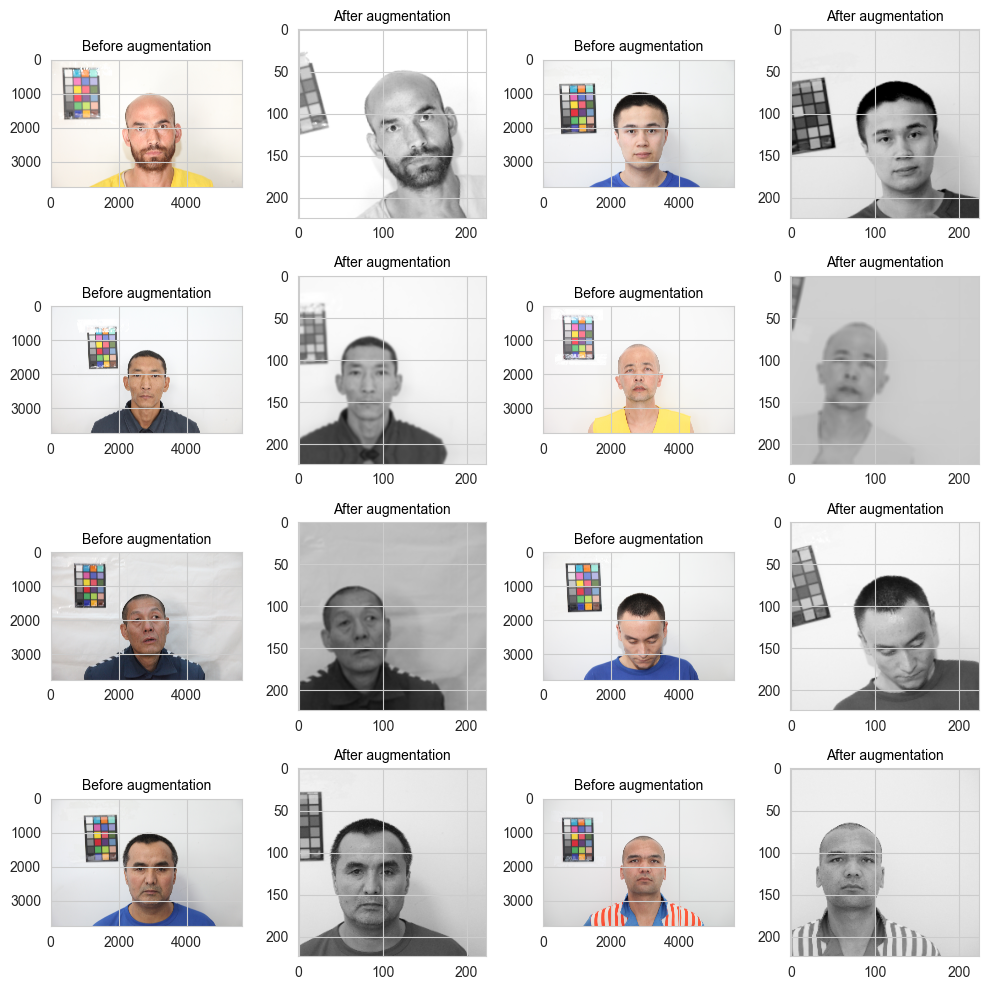

In [24]:
images = read_and_preprocess_img_list(df.index[38:46], True, num_cols=4, transforms=train_transform)

###Model module

In [25]:
if __name__ == '__main__':
  print("Setting up the model")
  # Create the base model and its functions
  class BaseModel(pl.LightningModule):
    def __init__(self, learning_rate=None, predict_viz_image_limit=predict_viz_image_limit):
      super().__init__()
      #initialize variables
      self.learning_rate = learning_rate
      self.bn_init = nn.BatchNorm2d(3)
      self.training_step_outputs = []
      self.valid_step_outputs = []
      self.test_step_outputs = []
      self.predict_step_outputs = []
      self.reference_image = None
      self.predict_viz_image_limit = predict_viz_image_limit
      self.model_visualized = False

    def forward(self,x):
      # normalization
      return self.bn_init(x)
        
    def configure_optimizers(self):
      # using different optimizers
      params = self.parameters()
      lr = self.learning_rate if self.learning_rate else LR
      if optimi=='Adam': 
        optimizer = torch.optim.Adam(params, lr, betas=betas, eps=eps, weight_decay=weight_decay, amsgrad=amsgrad)
      elif optimi=='AdamW':
        optimizer = torch.optim.AdamW(params, lr, betas=betas, eps=eps, weight_decay=weight_decay, amsgrad=amsgrad)
      elif optimi=='NAdam': 
        optimizer = torch.optim.NAdam(params, lr, betas=betas, eps=eps, weight_decay=weight_decay, momentum_decay=momentum_decay)
      elif optimi=='SGD': 
        optimizer = torch.optim.SGD(params, lr, momentum=momentum, dampening=dampening, weight_decay=weight_decay, nesterov=nesetrov)
      elif optimi=='RMSprop': 
        optimizer = torch.optim.RMSprop(params, lr, alpha=alpha, eps=eps, weight_decay=weight_decay, momentum=momentum, centered=centered)
      elif optimi=='Adadelta':
        optimizer = torch.optim.Adadelta(params, lr, rho=rho, eps=eps, weight_decay=weight_decay)
      elif optimi=='Adamax':
        optimizer = torch.optim.Adamax(params, lr, betas=betas, eps=eps, weight_decay=weight_decay)
      # different schedulers
      scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', verbose=True, factor=SCHEDULER_FACTOR, patience=SCHEDULER_PATIENCE, threshold=SCHEDULER_THRESHOLD)
      if USE_ONECYCLE:
        scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=1e-3, total_steps=self.trainer.estimated_stepping_batches, verbose=True, div_factor=CYCLE_DIV_FACTOR, final_div_factor=CYCLE_FINAL_DIV_FACTOR)
      if USE_SCHEDULER:
        return {
        'optimizer': optimizer,
        'lr_scheduler': {
          'scheduler': scheduler,
          'monitor': METRIC_TO_MONITOR    
          }
        }
      return [optimizer]

    def custom_histogram_adder(self):
      # iterating through and logging all parameters
      if self.logger:
        for name,params in self.named_parameters():
          self.logger.experiment.add_histogram(name,params,self.current_epoch)
        
    
    def setup(self, stage):
      # add all hyperparameters to tensorboard
      if self.logger:
        self.logger.experiment.add_text("PARAMS", str(PARAMS))

    # Common step between train, val, test, and pred
    def do_step(self, batch, mode='Train'):
      images = batch['image']
      preds = self(images)
      # don't log in train
      if self.logger and not mode in ['Train', 'Predict']:
        if not torch.is_tensor(self.reference_image):
          # storing reference images for visualizations
          vis_images = images[2:6]
          self.reference_image = images[:1]
          self.visualize_images = batch['image'][2:6]
          self.visualize_images_idxs = batch['img_idx'][2:6]
          self.visualize_labels_age = batch['age_label'][2:6]
          self.visualize_labels_ethnicity = batch['ethnicity_label'][2:6]
          self.visualize_labels_gender = batch['gender_label'][2:6]
          if not self.model_visualized and not Multitasking:
            self.logger.experiment.add_graph(FacesModel, self.reference_image)
            self.model_visualized = True
      # get different metrics for this batch
      if Multitasking:
        batch_dict = multi_batch_performance_metrics(batch, preds, loss_weights=self.trainer.datamodule.loss_weights)
      else:
        batch_dict = batch_performance_metrics(batch, preds, loss_weights=self.trainer.datamodule.loss_weights)
        
      return batch_dict

    
    def training_step(self, batch, batch_idx):
      batch_dict = self.do_step(batch, mode='Train')
      self.training_step_outputs.append(batch_dict)
      # Have to return something or otherwise cuda out of memory
      return batch_dict
        

    def validation_step(self, batch, batch_idx):
      batch_dict = self.do_step(batch, mode='Valid')
      self.valid_step_outputs.append(batch_dict)
      return batch_dict


    def test_step(self, batch, batch_idx):
      batch_dict = self.do_step(batch, mode='Test')
      self.test_step_outputs.append(batch_dict)
      return batch_dict

    
    def predict_step(self, batch, batch_idx):
      images = batch['image']
      num_of_imgs = min(images.size()[0], self.predict_viz_image_limit)
      preds = self(images)
      return preds, images[:num_of_imgs]
        

    def on_epoch_end(self, outputs, mode='Train'):
      epoch_dict = epoch_performance_metrics(outputs)

      # get variety of metrics
      precision_dict = dict(zip(CLASS_RANGES, epoch_dict['precision']))
      recall_dict = dict(zip(CLASS_RANGES, epoch_dict['recall']))
      f1_score_dict = dict(zip(CLASS_RANGES, epoch_dict['f1_score']))
      accuracy_dict = dict(zip(CLASS_RANGES, epoch_dict['accuracy']))

      epoch_loss = epoch_dict['total_loss']
      epoch_acc = epoch_dict['total_accuracy']
      epoch_macro_f1 =  epoch_dict['macro_f1']

      print(f"\n{mode} accuracy : ", epoch_acc)
      print(f"{mode} loss : ", epoch_loss)
      
      if self.logger:
        self.logger.experiment.add_scalar(f"Loss/{mode}",
                                          epoch_loss,
                                          self.current_epoch)
        self.logger.experiment.add_scalar(f"Accuracy/{mode}",
                                          epoch_acc,
                                          self.current_epoch)
        if not mode == 'train':
          #for checkpointing
          self.log(f"{mode}_macro_f1", epoch_macro_f1)
          self.log(f"{mode}_acc", epoch_acc)
          self.log(f"{mode}_both", epoch_acc+epoch_macro_f1)
          self.log("epoch", float(self.current_epoch))
          
          print(f"{mode} macro_f1 score : ", epoch_macro_f1)
          print(f"{mode} both : ", epoch_acc+epoch_macro_f1)
          
          # Tensorboard visualizations     
          self.logger.experiment.add_scalar(f"Macro_f1/{mode}",
                                            epoch_macro_f1,
                                            self.current_epoch)
          self.logger.experiment.add_scalar(f"Acc+Macro_f1/{mode}",
                                            epoch_acc+epoch_macro_f1,
                                            self.current_epoch)
          logger.experiment.add_figure("Confusion matrix", epoch_dict['conf_mat'], self.current_epoch)
          if torch.is_tensor(self.reference_image):
            pred_vs_act_fig = plot_classes_preds(self, self.visualize_images, self.visualize_images_idxs, self.visualize_labels_age, self.visualize_labels_gender, self.visualize_labels_ethnicity)
            pred_vs_act_fig.savefig(f'outputs/testing-{get_time()}.png')
            self.logger.experiment.add_figure('predictions vs. actuals',
              pred_vs_act_fig,
              self.current_epoch)
          # logging histograms - Can slow down the model
          self.custom_histogram_adder()
          self.reference_image = None
          self.visualize_images = None
          self.visualize_images_idxs = None
          self.visualize_labels_age = None
          self.visualize_labels_ethnicity = None
          self.visualize_labels_gender = None

    
    
    def multi_on_epoch_end(self, outputs, mode='Train'):
      epoch_dicts = multi_epoch_performance_metrics(outputs)
      loss = epoch_dicts['a']['total_loss']
      print(f"total {mode} loss : ", loss)
      # going through each of the three tasks: age, gender, and ethnicity and calculate the results
      for task in classifying_option[1:]:
        if task == 'a':
          label = "Results for age"
        if task == 'g':
          label = "Results for gender"
        if task == 'e':
          label = "Results for ethnicity"

        epoch_dict = epoch_dicts[task]
        
        print('\n')
        print(label)
        epoch_loss = epoch_dict['total_loss']
        epoch_acc = epoch_dict['total_accuracy']
        epoch_macro_f1 =  epoch_dict['macro_f1']

        print(f"\n{mode} accuracy : ", epoch_acc)

        if self.logger:
          self.logger.experiment.add_scalar(f"Loss/{task}_{mode}",
                                              epoch_loss,
                                              self.current_epoch)
          self.logger.experiment.add_scalar(f"Accuracy/{task}_{mode}",
                                              epoch_acc,
                                              self.current_epoch)
        if not mode == 'train':
          #for checkpointing
          self.log(f"{mode}_macro_f1", epoch_macro_f1)
          self.log(f"{mode}_acc", epoch_acc)
          self.log(f"{mode}_both", epoch_acc+epoch_macro_f1)
          self.log(f"{mode}_total_loss", epoch_loss)
          self.log("epoch", float(self.current_epoch))

          print(f"{mode} macro_f1 score : ", epoch_macro_f1)
          print(f"{mode} both : ", epoch_acc+epoch_macro_f1)

          # Tensorboard visualizations     

          self.logger.experiment.add_scalar(f"Macro_f1/{task}_{mode}",
                                              epoch_macro_f1,
                                              self.current_epoch)
          self.logger.experiment.add_scalar(f"Acc+Macro_f1/{task}_{mode}",
                                              epoch_acc+epoch_macro_f1,
                                              self.current_epoch)
          logger.experiment.add_figure("Confusion matrix", epoch_dict['conf_mat'], self.current_epoch)
          # logging histograms - Can slow down the model
          #self.custom_histogram_adder()
          self.reference_image = None
          self.visualize_images = None
          self.visualize_images_idxs = None
          self.visualize_labels_age = None
          self.visualize_labels_ethnicity = None
          self.visualize_labels_gender = None

    def on_train_epoch_end(self):
      outputs = self.training_step_outputs
      print(f"\nTraining for {training_indicator}")
      if Multitasking:
        self.multi_on_epoch_end(outputs, mode='Train')
      else:
        self.on_epoch_end(outputs, mode='Train')
      self.training_step_outputs.clear()  # free memory
        
    def on_validation_epoch_end(self):
      outputs = self.valid_step_outputs
      if Multitasking:
        self.multi_on_epoch_end(outputs, mode='Val')
      else:
        self.on_epoch_end(outputs, mode='Val')
      self.valid_step_outputs.clear()  # free memory

    def on_test_epoch_end(self):
      outputs = self.test_step_outputs
      if Multitasking:
        self.multi_on_epoch_end(outputs, mode='Test')
      else:
        self.on_epoch_end(outputs, mode='Test')      
      self.test_step_outputs.clear()  # free memory

  #3 basics cnv model that adapts to number of layers
  class Basic_cnv(BaseModel):
    def __init__(self, num_of_layers):
      super().__init__()
      self.bn1 = nn.BatchNorm2d(base_features)
      self.bn2 = nn.BatchNorm2d(base_features*2)
      self.bn3 = nn.BatchNorm2d(base_features*4)
      self.bn4 = nn.BatchNorm2d(base_features*8)
      self.bn5 = nn.BatchNorm2d(base_features*16)
      self.doi = nn.Dropout(0.1)
      self.do1 = nn.Dropout(0.1)
      self.do2 = nn.Dropout(0.1)
      self.do3 = nn.Dropout(0.1)
      self.do4 = nn.Dropout(0.1)
      self.do5 = nn.Dropout(0.1)
      self.doo = nn.Dropout(0.6)
      self.cnv1 = nn.Conv2d(3, base_features, kernel_size = 3, padding = 1)
      self.cnv2 = nn.Conv2d(base_features, base_features*2, kernel_size = 3, padding = 1)
      self.cnv3 = nn.Conv2d(base_features*2, base_features*4, kernel_size = 3, padding = 1)
      self.cnv4 = nn.Conv2d(base_features*4, base_features*8, kernel_size = 3, padding = 1)
      self.cnv5 = nn.Conv2d(base_features*8, base_features*16, kernel_size = 3, padding = 1)
      self.rel1 = nn.ReLU()
      self.rel2 = nn.ReLU()
      self.rel3 = nn.ReLU()
      self.rel4 = nn.ReLU()
      self.rel5 = nn.ReLU()
      self.relo = nn.ReLU()
      self.max1 = nn.MaxPool2d(2, 2)
      self.max2 = nn.MaxPool2d(2, 2)
      self.max3 = nn.MaxPool2d(2, 2)
      self.max4 = nn.MaxPool2d(2, 2)
      self.max5 = nn.MaxPool2d(2, 2)
      self.flat = nn.Flatten()
      num_of_features = int(IMG_SIZE/(2**num_of_layers))
      num_of_features *= num_of_features
      num_of_features *= base_features * (2**(num_of_layers-1))
      self.fc1 = nn.Linear(num_of_features, hidden_neurons)
      self.fc2 = nn.Linear(hidden_neurons, CLASSES)
      if Multitasking:
        self.fc_a = nn.Linear(hidden_neurons, 7)
        self.fc_g = nn.Linear(hidden_neurons, 2)
        self.fc_e = nn.Linear(hidden_neurons, 5)

  # multi-layered cnns
  class Basic_5cnv(Basic_cnv):
    def __init__(self):
      super().__init__(5)

    def forward(self,x):
      out = super().forward(x)
      out = self.max1(self.bn1(self.rel1(self.cnv1(out))))
      out = self.max2(self.bn2(self.rel2(self.cnv2(out))))
      out = self.max3(self.bn3(self.rel3(self.cnv3(out))))
      out = self.max4(self.bn4(self.rel4(self.cnv4(out))))
      out = self.max5(self.bn5(self.rel5(self.cnv5(out))))
      out = self.flat(out)
      out = self.doo(self.relo(self.fc1(out)))
      out = self.fc2(out)
      return out


  # optimal model
  class Basic_4cnv(Basic_cnv):
    def __init__(self):
      super().__init__(4)

    def forward(self,x):
      out = x
      if not USE_NORM:
        out = super().forward(x)
      out = self.max1(self.bn1(self.rel1(self.cnv1(out))))
      out = self.max2(self.bn2(self.rel2(self.cnv2(out))))
      out = self.max3(self.bn3(self.rel3(self.cnv3(out))))
      out = self.max4(self.bn4(self.rel4(self.cnv4(out))))
      out = self.flat(out)
      out = self.doo(self.relo(self.fc1(out)))
      if Multitasking:
        out_a = self.fc_a(out)
        out_g = self.fc_g(out)
        out_e = self.fc_e(out)
        return {'a': out_a, 'g': out_g, 'e': out_e}
      else:
        out = self.fc2(out)
        return out

  class Basic_3cnv(Basic_cnv):
    def __init__(self):
      super().__init__(3)

    def forward(self,x):
      out = super().forward(x)
      out = self.max1(self.bn1(self.rel1(self.cnv1(out))))
      out = self.max2(self.bn2(self.rel2(self.cnv2(out))))
      out = self.max3(self.bn3(self.rel3(self.cnv3(out))))
      out = self.flat(out)
      out = self.doo(self.relo(self.fc1(out)))
      out = self.fc2(out)
      return out

  class Basic_2cnv(Basic_cnv):
    def __init__(self):
      super().__init__(2)

    def forward(self,x):
      out = super().forward(x)
      out = self.max1(self.bn1(self.rel1(self.cnv1(out))))
      out = self.max2(self.bn2(self.rel2(self.cnv2(out))))
      out = self.flat(out)
      out = self.doo(self.relo(self.fc1(out)))
      out = self.fc2(out)
      return out

  class Basic_1cnv(Basic_cnv):
    def __init__(self):
      super().__init__(1)

    def forward(self,x):
      out = super().forward(x)
      out = self.max1(self.bn1(self.rel1(self.cnv1(out))))
      out = self.flat(out)
      out = self.fc1(out)
      out = self.fc2(out)
      return out

  # bases of all transfer learning
  class BaseTransfer(BaseModel):
    def __init__(self, model, pretrained):
      super().__init__()
      self.pretrained = pretrained
      # whether to use pretrained weight anf reeze, or train from scratch
      if pretrained:
        print("Using pretrained weights")
        weights="DEFAULT"
      else:
        print("Training from scratch")
        weights=None
      self.backbone = model(weights=weights)
      layers = list(self.backbone.children())[:-1]
      self.feature_extractor = nn.Sequential(*layers)
      if pretrained:
        # layers are frozen by using eval()
        self.feature_extractor.eval()
        # freeze params
        for param in self.feature_extractor.parameters():
          param.requires_grad = False


    def forward(self, x):
      representations = self.feature_extractor(x).flatten(1) 
      x = self.classifier(representations)
      return x
        
  class ResNet50(BaseTransfer):
    def __init__(self, model=resnet50, pretrained=IS_PRETRAINED):
      super().__init__(model, pretrained)
      num_filters = self.backbone.fc.in_features
      self.classifier = nn.Linear(num_filters, CLASSES)

    def forward(self, x):
      return super().forward(x)

  class ResNet152(BaseTransfer):
    def __init__(self, model=resnet152, pretrained=IS_PRETRAINED):
      super().__init__(model, pretrained)
      num_filters = self.backbone.fc.in_features
      self.classifier = nn.Linear(num_filters, CLASSES)

    def forward(self, x):
      return super().forward(x)

  class VGG16(BaseTransfer):
    def __init__(self, model=vgg16, pretrained=IS_PRETRAINED):
      super().__init__(model, pretrained)
      num_filters = self.backbone.classifier[0].in_features
      self.classifier = self.backbone.classifier
      if pretrained:
        # layers are frozen by using eval()
        self.classifier.eval()
        # freeze params
        for param in self.classifier.parameters():
          param.requires_grad = False
      self.classifier = nn.Linear(num_filters, CLASSES)

    def forward(self, x):
      return super().forward(x)

  class DenseNet121(BaseTransfer):
    def __init__(self, model=densenet121, pretrained=IS_PRETRAINED):
      super().__init__(model, pretrained)
      num_filters = self.backbone.classifier.in_features    
      self.classifier = nn.Linear(num_filters*7*7, CLASSES)

    def forward(self, x):
      return super().forward(x)

  class DenseNet201(BaseTransfer):
    def __init__(self, model=densenet201, pretrained=IS_PRETRAINED):
      super().__init__(model, pretrained)
      num_filters = self.backbone.classifier.in_features    
      self.classifier = nn.Linear(num_filters*7*7, CLASSES)

    def forward(self, x):
      return super().forward(x)

  class EfficientNet_V2_S(BaseTransfer):
    def __init__(self, model=efficientnet_v2_s, pretrained=IS_PRETRAINED):
      super().__init__(model, pretrained)
      num_filters = self.backbone.classifier[1].in_features    
      self.classifier = self.backbone.classifier
      self.classifier[1] = nn.Linear(num_filters, CLASSES)

    def forward(self, x):
      return super().forward(x)
        
  class EfficientNet_V2_M(BaseTransfer):
    def __init__(self, model=efficientnet_v2_m, pretrained=IS_PRETRAINED):
      super().__init__(model, pretrained)
      num_filters = self.backbone.classifier[1].in_features    
      self.classifier = self.backbone.classifier
      self.classifier[1] = nn.Linear(num_filters, CLASSES)

    def forward(self, x):
      return super().forward(x)
        
  class EfficientNet_V2_L(BaseTransfer):
    def __init__(self, model=efficientnet_v2_l, pretrained=IS_PRETRAINED):
      super().__init__(model, pretrained)
      num_filters = self.backbone.classifier[1].in_features    
      self.classifier = self.backbone.classifier
      self.classifier[1] = nn.Linear(num_filters, CLASSES)

    def forward(self, x):
      return super().forward(x)

  class InceptionResnetV1_Facenet(BaseModel):
    def __init__(self, pretrained=IS_PRETRAINED):
      super().__init__()
      # Create an inception resnet:
      self.inception_resnet = InceptionResnetV1(classify=True,
        pretrained='vggface2' if pretrained else None,
        num_classes=CLASSES,
        device = device,
        dropout_prob=0.5)
      if pretrained:
        for param in self.inception_resnet.parameters():
          param.requires_grad = False
        if not MORE_FREEZE:
          for param in self.inception_resnet.last_linear.parameters():
            param.requires_grad = True

      num_filters = self.inception_resnet.logits.in_features
      self.inception_resnet.logits = nn.Linear(num_filters, CLASSES)

    def forward(self, x):
      out = super().forward(x)
      out = self.inQception_resnet(out)
      return out
class ResidualAttentionModel(BaseModel):
    # for input size 224
    def __init__(self):
        super(ResidualAttentionModel, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias = False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.mpool1 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.residual_block1 = ResidualBlock(64, 256)
        self.attention_module1 = AttentionModule_stage1(256, 256)
        self.residual_block2 = ResidualBlock(256, 512, 2)
        self.attention_module2 = AttentionModule_stage2(512, 512)
        self.attention_module2_2 = AttentionModule_stage2(512, 512)  # tbq add
        self.residual_block3 = ResidualBlock(512, 1024, 2)
        self.attention_module3 = AttentionModule_stage3(1024, 1024)
        self.attention_module3_2 = AttentionModule_stage3(1024, 1024)  # tbq add
        self.attention_module3_3 = AttentionModule_stage3(1024, 1024)  # tbq add
        self.residual_block4 = ResidualBlock(1024, 2048, 2)
        self.residual_block5 = ResidualBlock(2048, 2048)
        self.residual_block6 = ResidualBlock(2048, 2048)
        self.mpool2 = nn.Sequential(
            nn.BatchNorm2d(2048),
            nn.ReLU(inplace=True),
            nn.AvgPool2d(kernel_size=7, stride=1)
        )
        self.fc = nn.Linear(2048,10)

    def forward(self, x):
        out = self.conv1(x)
        out = self.mpool1(out)
        out = self.residual_block1(out)
        out = self.attention_module1(out)
        out = self.residual_block2(out)
        out = self.attention_module2(out)
        out = self.attention_module2_2(out)
        out = self.residual_block3(out)
        out = self.attention_module3(out)
        out = self.attention_module3_2(out)
        out = self.attention_module3_3(out)
        out = self.residual_block4(out)
        out = self.residual_block5(out)
        out = self.residual_block6(out)
        out = self.mpool2(out)
        out = out.view(out.size(0), -1)
        out = self.fc(out)

        return out

Setting up the model


###Model training

In [31]:
def main_model_train(df_to_use=None, LOGGER_VERSION=f"{get_time()}-{BATCH_SIZE}", training_string="generic model", num_sanity_val_steps=2, enable_model_summary=False, ckpt_path=None, predict_labels=False):
  # Train the model
  global FacesModel
  global logger
  global trainer
  global deterministic
  global training_indicator
  global base_features
  global hidden_neurons
  global CLASS_RANGES
  global CLASSES
  training_indicator = training_string
  METRIC_TO_MONITOR = 'Val_both' if not Multitasking else "Val_total_loss"

  # assign labels and model complexity based on the classification task
  if CLASS_AGE or Multitasking:
    CLASS_RANGES = LABEL_TO_AGE_RANGES
    base_features = 64
    hidden_neurons = 132
  elif CLASS_GENDER:
    CLASS_RANGES = LABEL_TO_GENDER
    base_features = 32
    hidden_neurons = 64
  elif CLASS_ETHNICITY:
    CLASS_RANGES = LABEL_TO_ETHNICITY
    base_features = 64
    hidden_neurons = 64
  CLASSES = len(CLASS_RANGES)
  PARAMS['base_features'] = base_features
  PARAMS['hidden_neurons'] = hidden_neurons
  #reproducability
  random_seed = 42
  deterministic = False
  if DETERMINISM:
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.backends.cudnn.benchmark = False
    np.random.seed(random_seed)
    pl.seed_everything(random_seed, workers=True)
    torch.backends.cudnn.deterministic = True
    deterministic=True
    torch.use_deterministic_algorithms(True)

  # callbacks
  checkpoint_callback = ModelCheckpoint(
    dirpath=CHECKPOINT_PATH, 
    save_top_k=2, 
    monitor=METRIC_TO_MONITOR,
    mode="max" if not Multitasking else "min",
    filename=CHECKPOINT_FILENAME,
    verbose=True,
    )
  early_stop_callback = EarlyStopping(
    monitor=METRIC_TO_MONITOR, 
    min_delta=0.0005, 
    patience=20 if USE_PRETRAINED_MODEL else 10, 
    verbose=True, 
    mode="max" if not Multitasking else "min",
    strict=True,
    divergence_threshold=0.001 if not Multitasking else None 
    )
  SWA_callback = StochasticWeightAveraging(
    swa_lrs = SWA_LRS, 
    swa_epoch_start=SWA_EPOCH_START, 
    annealing_epochs=ANNEALING_EPOCHS
    )
  
  callbacks = [early_stop_callback, checkpoint_callback]
  if USE_SWA:
    callbacks = [early_stop_callback, SWA_callback]

  # initializing datamodule, model, logger, and start training
  faces=FacesDataModule(train_transform, val_transform, weighted_sampler=WEIGHTED_SAMPLER if not predict_labels else False, df_to_use=df_to_use)
  FacesModel = get_model(MODEL_IDX)()
  logger = TensorBoardLogger('tb_logs', name=LOGGER_NAME, version=LOGGER_VERSION, default_hp_metric=True)
  print(f"Logging to {LOGGER_NAME}/{LOGGER_VERSION}")
  kwargs_trainer = {
    "max_epochs": EPOCHS if not predict_labels else 1, 
    "callbacks": callbacks if not predict_labels else None, 
    "logger": logger, 
    "deterministic": deterministic, 
    "num_sanity_val_steps": num_sanity_val_steps, 
    "enable_model_summary": enable_model_summary,
  }
  if not device=='cpu':
    kwargs_trainer['accelerator']="gpu"
    kwargs_trainer['devices']=[USED_GPU_NUM]
  
  # if a pretrained model is used
  if not ckpt_path == None:
    FacesModel = FacesModel.load_from_checkpoint(ckpt_path, map_location=torch.device(device))
    if FREEZE_LAYERS:
      FacesModel.freeze()
      if not MORE_FREEZE:
        FacesModel.fc1.requires_grad_(True)
      FacesModel.fc2 = nn.Linear(hidden_neurons, CLASSES)

  trainer = pl.Trainer(**kwargs_trainer)
  trainer.fit(FacesModel, faces, ckpt_path=FINAL_CKPT if USE_CKPT else None)

  # save the best model in the same folder as the logger
  if SAVE_BEST_MODEL and not predict_labels:
    best_model_path = trainer.checkpoint_callback.best_model_path
    run_command(f"cp '{best_model_path}' 'tb_logs/{LOGGER_NAME}/{LOGGER_VERSION}'")
    print(f"Best model saved to : 'tb_logs/{LOGGER_NAME}/{LOGGER_VERSION}/{best_model_path.split('/')[-1]}'")

In [32]:
# return the model arguments
def get_kwargs_main_model(logger_version_string="", df_to_use=None, num_sanity_val_steps=0, enable_model_summary=False, training_string=None):
  if training_string == None:
    training_string = logger_version_string
  kwargs_main_model = {
  "LOGGER_VERSION": f"{get_time()}_{logger_version_string}",
  "training_string": training_string,
  "df_to_use": df_to_use,
  "num_sanity_val_steps": num_sanity_val_steps,
  "enable_model_summary": enable_model_summary
  }
  if USE_PRETRAINED_MODEL and CLASS_AGE:
    kwargs_main_model['ckpt_path'] = FINAL_CKPT
  return kwargs_main_model

In [ ]:
# training the model
if __name__ == '__main__' and not IS_PREDICT:
  torch.multiprocessing.set_start_method('spawn', force=True)
  Multitasking = False
  classifying_options = ['a', 'g', 'e', 'ga', 'ea', 'ega', 'gea', 'pga', 'pea', 'ge', 'eg', 'pepga', 'pgpea', 'apga', 'apea', 'mage', '19']
  classifying_option = classifying_options[CLASS_PREDICTION]
  PARAMS['CLASSIFYING_OPTION'] = classifying_option
  print("CLASSIFYING OPTION: ", classifying_option)
  LOGGER_NAME = f"{get_time()}_{classifying_option}"
  FINAL_CKPT = f'compressed_data/{AGE_CKPT}'
  DOWNLOAD_FILENAMES.extend([AGE_CKPT, GENDER_CKPT, ETHNICITY_CKPT])

  df_white = df[df['ethnicity_label']==0]
  df_black = df[df['ethnicity_label']==1]
  df_asian = df[df['ethnicity_label']==2]
  df_indian = df[df['ethnicity_label']==3]
  df_other = df[df['ethnicity_label']==4]

  df_male = df[df['gender_label']==0]
  df_female = df[df['gender_label']==1]


  # Multitasking
  if classifying_option in ['mage']:
    Multitasking = True
    main_model_train(**get_kwargs_main_model(classifying_option, None))
    
  # Classifying age
  if classifying_option == 'a':
    CLASS_AGE = True
    main_model_train(**get_kwargs_main_model("age", None))
    
  # Classifying gender
  elif classifying_option in ['g', 'pga']:
    CLASS_GENDER = True    
    main_model_train(**get_kwargs_main_model("gender", None))

    # Classifying age on predicted gender
    if classifying_option == 'pga':
      CLASS_GENDER = False
      CLASS_AGE = True
      df_copy_male = df_copy[df_copy['predicted_gender_label']==0]
      df_copy_female = df_copy[df_copy['predicted_gender_label']==1]

      # Classifying age on predicted males
      main_model_train(**get_kwargs_main_model("predicted_male_age", df_copy_male))
      
      # Classifying age on predicted females
      main_model_train(**get_kwargs_main_model("predicted_female_age", df_copy_female))
  
  # Classifying age based on predicted gender
  elif classifying_option == 'apga':
    # Classifying gender
    CLASS_RANGES = LABEL_TO_GENDER
    CLASSES = len(CLASS_RANGES)
    CLASS_GENDER = True    

    FINAL_CKPT = f'compressed_data/{GENDER_CKPT}'
    FacesModel = get_model(MODEL_IDX)()
    FacesModel = FacesModel.load_from_checkpoint(FINAL_CKPT, map_location=torch.device(device))
    kwargs_trainer = {
      "max_epochs": EPOCHS, 
      "deterministic": deterministic, 
    }
    if not device=='cpu':
      kwargs_trainer['accelerator']="gpu"
      kwargs_trainer['devices']=[USED_GPU_NUM]

    main_model_train(**get_kwargs_main_model("gender", None), predict_labels = True)

    # Classifying age
    CLASS_GENDER = False    
    CLASS_AGE = True
    FINAL_CKPT = f'compressed_data/{AGE_CKPT}'

    df_copy_male = df_copy[df_copy['predicted_gender_label']==0]
    df_copy_female = df_copy[df_copy['predicted_gender_label']==1]

    # Classifying age on predicted male
    main_model_train(**get_kwargs_main_model("male_age", df_copy_male))
  
    # Classifying age on predicted female
    main_model_train(**get_kwargs_main_model("female_age", df_copy_female))

  elif classifying_option == 'apea':
    # Classifying ethnicity
    CLASS_RANGES = LABEL_TO_ETHNICITY
    CLASSES = len(CLASS_RANGES)
    CLASS_ETHNICITY = True

    # main_model_train(**get_kwargs_main_model("ethnicity", None))

    FINAL_CKPT = f'compressed_data/{ETHNICITY_CKPT}'
    FacesModel = get_model(MODEL_IDX)()
    FacesModel = FacesModel.load_from_checkpoint(FINAL_CKPT, map_location=torch.device(device))
    kwargs_trainer = {
      "max_epochs": EPOCHS, 
      "deterministic": deterministic, 
    }
    if not device=='cpu':
      kwargs_trainer['accelerator']="gpu"
      kwargs_trainer['devices']=[USED_GPU_NUM]

    faces=FacesDataModule(train_transform, val_transform, weighted_sampler=WEIGHTED_SAMPLER, df_to_use=None)
    trainer = pl.Trainer(**kwargs_trainer)
    trainer.test(FacesModel, faces)

   
    # Classifying age
    CLASS_ETHNICITY = False    
    CLASS_AGE = True
    FINAL_CKPT = f'compressed_data/{AGE_CKPT}'

    df_copy_white = df_copy[df_copy['predicted_ethnicity_label']==0]
    df_copy_black = df_copy[df_copy['predicted_ethnicity_label']==1]
    df_copy_asian = df_copy[df_copy['predicted_ethnicity_label']==2]
    df_copy_indian = df_copy[df_copy['predicted_ethnicity_label']==3]
    df_copy_other = df_copy[df_copy['predicted_ethnicity_label']==4]


    # Classifying age on predicted ethnicity
    main_model_train(**get_kwargs_main_model("white_age", df_copy_white))
    main_model_train(**get_kwargs_main_model("black_age", df_copy_black))
    main_model_train(**get_kwargs_main_model("asian_age", df_copy_asian))
    main_model_train(**get_kwargs_main_model("indian_age", df_copy_indian))
    main_model_train(**get_kwargs_main_model("other_age", df_copy_other))


  # Classifying gender based on ethnicity
  elif classifying_option == 'eg':
    CLASS_GENDER = True    
    FINAL_CKPT = f'compressed_data/{GENDER_CKPT}'

    # Classifying gender on white
    main_model_train(**get_kwargs_main_model("white_gender", df_white))

    # Classifying gender on black
    main_model_train(**get_kwargs_main_model("black_gender", df_black))

    # Classifying gender on asian
    main_model_train(**get_kwargs_main_model("asian_gender", df_asian))

    # Classifying gender on indian
    main_model_train(**get_kwargs_main_model("indian_gender", df_indian))

    # Classifying gender on other
    main_model_train(**get_kwargs_main_model("other_gender", df_other))

  # Classifying ethnicity based on gender
  elif classifying_option == 'ge':
    CLASS_ETHNICITY = True 
    FINAL_CKPT = f'compressed_data/{ETHNICITY_CKPT}'

    # Classifying ethnicity on male
    main_model_train(**get_kwargs_main_model("male_ethnicity", df_male))

    # Classifying ethnicity on female
    main_model_train(**get_kwargs_main_model("female_ethnicity", df_female))

  # Classifying ethnicity
  elif classifying_option in ['e', 'pea']:
    CLASS_ETHNICITY = True
    main_model_train(**get_kwargs_main_model("ethnicity", None))

    # Classifying age on predicted ethnicity
    if classifying_option == 'pea':
      CLASS_AGE = True
      CLASS_ETHNICITY = False

      df_copy_white = df_copy[df_copy['predicted_ethnicity_label']==0]
      df_copy_black = df_copy[df_copy['predicted_ethnicity_label']==1]
      df_copy_asian = df_copy[df_copy['predicted_ethnicity_label']==2]
      df_copy_indian = df_copy[df_copy['predicted_ethnicity_label']==3]
      df_copy_other = df_copy[df_copy['predicted_ethnicity_label']==4]

      # Classifying age on predicted white
      main_model_train(**get_kwargs_main_model("predicted_white_age", df_copy_white))

      # Classifying age on predicted black
      main_model_train(**get_kwargs_main_model("predicted_black_age", df_copy_black))

      # Classifying age on predicted asian
      main_model_train(**get_kwargs_main_model("predicted_asian_age", df_copy_asian))

      # Classifying age on predicted indian
      main_model_train(**get_kwargs_main_model("predicted_indian_age", df_copy_indian))

      # Classifying age on predicted other
      main_model_train(**get_kwargs_main_model("predicted_other_age", df_copy_other))

  # Classifying age based on gender
  elif classifying_option == 'ga':
    CLASS_AGE = True

    # Classifying age on males
    main_model_train(**get_kwargs_main_model("male_age", df_male))
    
    # Classifying age on females
    main_model_train(**get_kwargs_main_model("female_age", df_female))

  # Classifying age based on ethnicity
  elif classifying_option == 'ea':
    CLASS_AGE = True

    # Classifying age on white
    main_model_train(**get_kwargs_main_model("white_age", df_white))

    # Classifying age on black
    main_model_train(**get_kwargs_main_model("black_age", df_black))

    # Classifying age on asian
    main_model_train(**get_kwargs_main_model("asian_age", df_asian))

    # Classifying age on indian
    main_model_train(**get_kwargs_main_model("indian_age", df_indian))

    # Classifying age on other
    main_model_train(**get_kwargs_main_model("other_age", df_other))

  # Classifying age based on gender and ethnicity
  elif classifying_option in ['ega', 'gea']:
    CLASS_AGE = True

    df_white = df[df['ethnicity_label']==0]
    df_black = df[df['ethnicity_label']==1]
    df_asian = df[df['ethnicity_label']==2]
    df_indian = df[df['ethnicity_label']==3]
    df_other = df[df['ethnicity_label']==4]

    df_white_male = df_white[df_white['gender_label']==0]
    df_black_male = df_black[df_black['gender_label']==0]
    df_asian_male = df_asian[df_asian['gender_label']==0]
    df_indian_male = df_indian[df_indian['gender_label']==0]
    df_other_male = df_other[df_other['gender_label']==0]

    df_white_female = df_white[df_white['gender_label']==1]
    df_black_female = df_black[df_black['gender_label']==1]
    df_asian_female = df_asian[df_asian['gender_label']==1]
    df_indian_female = df_indian[df_indian['gender_label']==1]
    df_other_female = df_other[df_other['gender_label']==1]

    # Classifying age on white
    main_model_train(**get_kwargs_main_model("white_male_age", df_white_male))
    main_model_train(**get_kwargs_main_model("white_female_age", df_white_female))
  
    # Classifying age on black
    main_model_train(**get_kwargs_main_model("black_male_age", df_black_male))
    main_model_train(**get_kwargs_main_model("black_female_age", df_black_female))
    
    # Classifying age on asian
    main_model_train(**get_kwargs_main_model("asian_male_age", df_asian_male))
    main_model_train(**get_kwargs_main_model("asian_female_age", df_asian_female))

    # Classifying age on indian
    main_model_train(**get_kwargs_main_model("indian_male_age", df_indian_male))
    main_model_train(**get_kwargs_main_model("indian_female_age", df_indian_female))

    # Classifying age on other
    main_model_train(**get_kwargs_main_model("other_male_age", df_other_male))
    main_model_train(**get_kwargs_main_model("other_female_age", df_other_female))

  # Classifying age based on predicted gender and ethnicity
  elif classifying_option in ['pepga', 'pgpea']:
    # Classifying ethnicity
    CLASS_RANGES = LABEL_TO_ETHNICITY
    CLASSES = len(CLASS_RANGES)
    CLASS_ETHNICITY = True

    # main_model_train(**get_kwargs_main_model("ethnicity", None))

    FINAL_CKPT = f'compressed_data/{ETHNICITY_CKPT}'
    FacesModel = get_model(MODEL_IDX)()
    FacesModel = FacesModel.load_from_checkpoint(FINAL_CKPT, map_location=torch.device(device))
    kwargs_trainer = {
      "max_epochs": EPOCHS, 
      "deterministic": deterministic, 
    }
    if not device=='cpu':
      kwargs_trainer['accelerator']="gpu"
      kwargs_trainer['devices']=[USED_GPU_NUM]

    faces=FacesDataModule(train_transform, val_transform, weighted_sampler=WEIGHTED_SAMPLER, df_to_use=None)
    trainer = pl.Trainer(**kwargs_trainer)
    trainer.test(FacesModel, faces)

    # Classifying gender
    CLASS_RANGES = LABEL_TO_GENDER
    CLASSES = len(CLASS_RANGES)
    CLASS_GENDER = True    
    CLASS_ETHNICITY = False

    # main_model_train(**get_kwargs_main_model("gender", None))

    FINAL_CKPT = f'compressed_data/{GENDER_CKPT}'
    FacesModel = get_model(MODEL_IDX)()
    FacesModel = FacesModel.load_from_checkpoint(FINAL_CKPT, map_location=torch.device(device))
    kwargs_trainer = {
      "max_epochs": EPOCHS, 
      "deterministic": deterministic, 
    }
    if not device=='cpu':
      kwargs_trainer['accelerator']="gpu"
      kwargs_trainer['devices']=[USED_GPU_NUM]

    faces=FacesDataModule(train_transform, val_transform, weighted_sampler=WEIGHTED_SAMPLER, df_to_use=None)
    trainer = pl.Trainer(**kwargs_trainer)
    trainer.test(FacesModel, faces)


    # Classifying age
    CLASS_GENDER = False    
    CLASS_AGE = True
    df_copy_male = df_copy[df_copy['predicted_gender_label']==0]
    df_copy_female = df_copy[df_copy['predicted_gender_label']==1]
    FINAL_CKPT = f'compressed_data/{AGE_CKPT}'

    df_copy_male_white = df_copy_male[df_copy_male['predicted_ethnicity_label']==0]
    df_copy_male_black = df_copy_male[df_copy_male['predicted_ethnicity_label']==1]
    df_copy_male_asian = df_copy_male[df_copy_male['predicted_ethnicity_label']==2]
    df_copy_male_indian = df_copy_male[df_copy_male['predicted_ethnicity_label']==3]
    df_copy_male_other = df_copy_male[df_copy_male['predicted_ethnicity_label']==4]

    df_copy_female_white = df_copy_female[df_copy_female['predicted_ethnicity_label']==0]
    df_copy_female_black = df_copy_female[df_copy_female['predicted_ethnicity_label']==1]
    df_copy_female_asian = df_copy_female[df_copy_female['predicted_ethnicity_label']==2]
    df_copy_female_indian = df_copy_female[df_copy_female['predicted_ethnicity_label']==3]
    df_copy_female_other = df_copy_female[df_copy_female['predicted_ethnicity_label']==4]


    # Classifying age on predicted white
    main_model_train(**get_kwargs_main_model("white_male_age", df_copy_male_white))
    main_model_train(**get_kwargs_main_model("white_female_age", df_copy_female_white))
  
    # Classifying age on predicted black
    main_model_train(**get_kwargs_main_model("black_male_age", df_copy_male_black))
    main_model_train(**get_kwargs_main_model("black_female_age", df_copy_female_black))
    
    # Classifying age on predicted asian
    main_model_train(**get_kwargs_main_model("asian_male_age", df_copy_male_asian))
    main_model_train(**get_kwargs_main_model("asian_female_age", df_copy_female_asian))

    # Classifying age on predicted indian
    main_model_train(**get_kwargs_main_model("indian_male_age", df_copy_male_indian))
    main_model_train(**get_kwargs_main_model("indian_female_age", df_copy_female_indian))

    # Classifying age on predicted other
    main_model_train(**get_kwargs_main_model("other_male_age", df_copy_male_other))
    main_model_train(**get_kwargs_main_model("other_female_age", df_copy_female_other))

### Training visualization



In [ ]:
%load_ext tensorboard
%tensorboard --logdir tb_logs/

###Predicting using the trained model

INFO:lightning_fabric.utilities.seed:Global seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

Predicted output: 0-2
Predicted output: 66-116
Predicted output: 31-40
Predicted output: 31-40
imgs_to_predict
7     data/utk_face/images/3_0_0_20170110213411465.j...
8     data/utk_face/images/90_0_0_20170117174936333....
9     data/utk_face/images/35_0_0_20170108235715593....
10    data/utk_face/images/48_0_3_20170119200742252....
Name: img_idx, dtype: object


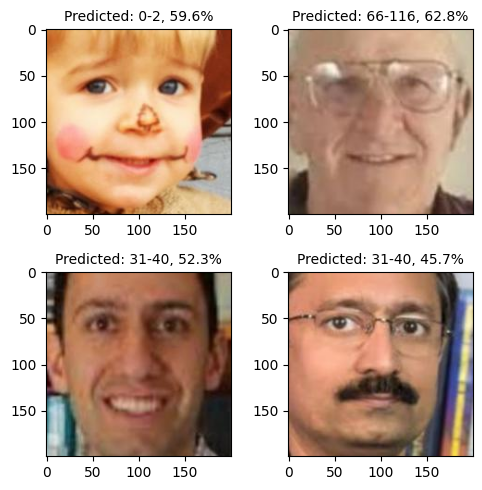

In [42]:
# predicting new images
if __name__ == '__main__' and not Multitasking:
  imgs_to_predict = pd.read_csv('data/validation_data.xlsx.csv')['img_idx'][7:11]
  #reproducability
  random_seed = 42
  deterministic = False
  if DETERMINISM:
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.backends.cudnn.benchmark = False
    np.random.seed(random_seed)
    pl.seed_everything(random_seed, workers=True)
    torch.backends.cudnn.deterministic = True
    deterministic=True
    torch.use_deterministic_algorithms(True)

  kwargs_trainer = {
    "max_epochs": 1, 
    "logger": False, 
    "deterministic": deterministic, 
  }
  if not device=='cpu':
    kwargs_trainer['accelerator']="gpu"
    kwargs_trainer['devices']=[USED_GPU_NUM]


  if device=='cpu':
    trainer = pl.Trainer(deterministic=deterministic, logger=False)
  else:
    trainer = pl.Trainer(deterministic=deterministic, logger=False, accelerator="gpu", devices=[USED_GPU_NUM])


  if IS_PREDICT:
    pred_labels_a = []
    pred_labels_g = []
    pred_labels_e = []
    # Get prediction images
    directory = IMAGES_TO_PREDICT_DIR
    file_extensions = ['*.jpg', '*.png', '*.jpeg'] 
    image_paths = []
    for extension in file_extensions:
      search_pattern = os.path.join(directory, extension)
      image_paths.extend(glob.glob(search_pattern))
    imgs_to_predict = image_paths
    start_img_idx = 34
    rng = random.Random()
    img_idxs = rng.sample(range(1, 1001), 4)
    img_idxs = [i for i in range(start_img_idx, start_img_idx+9)]
    imgs_to_predict = pd.read_csv('data/valid.csv')['img_idx'][img_idxs]
    faces_pred=FacesDataModule(train_transform, val_transform, imgs_to_predict)
    print("imgs_to_predict")
    print(imgs_to_predict)
    for i in range(3):
      # assign labels and model complexity based on the classification task
      CLASS_AGE = False
      CLASS_GENDER = False
      CLASS_ETHNICITY = False
      if i == 0:
        CLASS_AGE = True
      elif i == 1:
        CLASS_GENDER = True
      else:
        CLASS_ETHNICITY = True
      if CLASS_AGE:
        CLASS_RANGES = LABEL_TO_AGE_RANGES
        base_features = 64
        hidden_neurons = 132
        FINAL_CKPT = f'compressed_data/{AGE_CKPT}'
        pred_indicator = 'Age'
      elif CLASS_GENDER:
        CLASS_RANGES = LABEL_TO_GENDER
        base_features = 32
        hidden_neurons = 64
        FINAL_CKPT = f'compressed_data/{GENDER_CKPT}'
        pred_indicator = 'Gender'
      elif CLASS_ETHNICITY:
        CLASS_RANGES = LABEL_TO_ETHNICITY
        base_features = 64
        hidden_neurons = 64
        FINAL_CKPT = f'compressed_data/{ETHNICITY_CKPT}'
        pred_indicator = 'Ethnicity'
      CLASSES = len(CLASS_RANGES)


      FacesModel = get_model(MODEL_IDX)().load_from_checkpoint(FINAL_CKPT, map_location=torch.device(device))
      print(f"\nPredicting {pred_indicator} based on model")
      FacesModel.eval()
      FacesModel.freeze()
      outputs = trainer.predict(FacesModel, faces_pred)
      for batch in outputs:
        for output in batch[0]:
          _, pred_idx = torch.max(output, 0)
          pred = CLASS_RANGES[pred_idx]
          # convert output probabilities to predicted class
          _, preds_tensor = torch.max(output, 0)
          pred_idx = preds_tensor.cpu()
          pred_prob = F.softmax(output, dim=0)[pred_idx]*100
          pred = CLASS_RANGES[pred_idx]
          pred_label = f"{pred_indicator}: {pred} {pred_prob:.1f}%"
          print(f"Predicted output: {pred_label}")
          if CLASS_AGE:
            pred_labels_a.append(pred_label)
          elif CLASS_GENDER:
            pred_labels_g.append(pred_label)
          elif CLASS_ETHNICITY:
            pred_labels_e.append(pred_label)
    pred_labels = [f"{pred_labels_a[i]}\n{pred_labels_g[i]}\n{pred_labels_e[i]}" for i in range(len(pred_labels_a))]
    plotted_fig = plot_classes_preds(FacesModel, torch.clone(outputs[0][1]).detach(), imgs_to_predict[:predict_viz_image_limit], fig_size = (5,5), preds_ready = True, titles_list = pred_labels)
    plotted_fig.savefig(f'outputs/predictions-{get_time()}.png', facecolor="white", edgecolor='none')

  else:
    faces_pred=FacesDataModule(train_transform, val_transform, imgs_to_predict)
    FacesModel.eval()
    FacesModel.freeze()
    outputs = trainer.predict(FacesModel, faces_pred)
    plotted_fig = plot_classes_preds(FacesModel, torch.clone(outputs[0][1]).detach(), imgs_to_predict[:predict_viz_image_limit], fig_size = (5,5))
    plotted_fig.savefig(f'outputs/predictions-{get_time()}.png', facecolor="white", edgecolor='none')
    predictions = []
    for batch in outputs:
      for output in batch[0]:
        _, pred_idx = torch.max(output, 0)
        pred = CLASS_RANGES[pred_idx]
        predictions.append(pred)
        print(f"Predicted output: {pred}")
  print("imgs_to_predict")
  print(imgs_to_predict)

In [43]:
predict_viz_image_limit = 36

INFO:lightning_fabric.utilities.seed:Global seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

Predicted output: 0-2
Predicted output: 66-116
Predicted output: 31-40
Predicted output: 31-40
imgs_to_predict
7     data/utk_face/images/3_0_0_20170110213411465.j...
8     data/utk_face/images/90_0_0_20170117174936333....
9     data/utk_face/images/35_0_0_20170108235715593....
10    data/utk_face/images/48_0_3_20170119200742252....
Name: img_idx, dtype: object


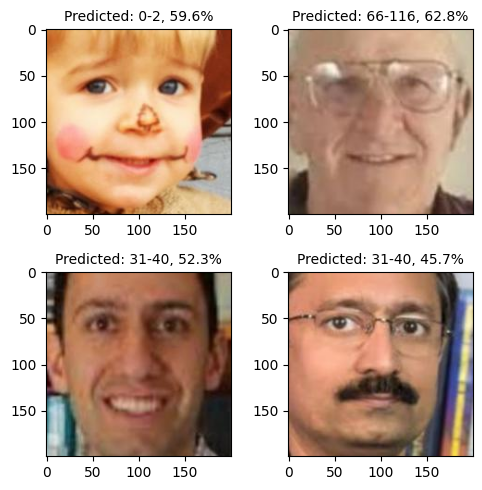

In [50]:
# predicting new images
if __name__ == '__main__' and not Multitasking:
  imgs_to_predict = pd.read_csv('data/validation_data.xlsx.csv')['img_idx'][7:11]
  #reproducability
  random_seed = 42
  deterministic = False
  if DETERMINISM:
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.backends.cudnn.benchmark = False
    np.random.seed(random_seed)
    pl.seed_everything(random_seed, workers=True)
    torch.backends.cudnn.deterministic = True
    deterministic=True
    torch.use_deterministic_algorithms(True)

  kwargs_trainer = {
    "max_epochs": 1, 
    "logger": False, 
    "deterministic": deterministic, 
  }
  if not device=='cpu':
    kwargs_trainer['accelerator']="gpu"
    kwargs_trainer['devices']=[USED_GPU_NUM]


  if device=='cpu':
    trainer = pl.Trainer(deterministic=deterministic, logger=False)
  else:
    trainer = pl.Trainer(deterministic=deterministic, logger=False, accelerator="gpu", devices=[USED_GPU_NUM])
  if IS_PREDICT:
    print("HAHA")
    pred_labels_a = []
    pred_labels_g = []
    pred_labels_e = []
    # Get prediction images
    directory = IMAGES_TO_PREDICT_DIR
    file_extensions = ['*.jpg', '*.png', '*.jpeg'] 
    image_paths = []
    for extension in file_extensions:
      search_pattern = os.path.join(directory, extension)
      image_paths.extend(glob.glob(search_pattern))
    imgs_to_predict = image_paths
    start_img_idx = 34
    start_img_idx = 400
    rng = random.Random()
    img_idxs = rng.sample(range(1, 1001), 4)
    img_idxs = [i for i in range(start_img_idx, start_img_idx+9)]
    img_idxs = [i for i in range(start_img_idx, start_img_idx+predict_viz_image_limit)]
    df_f = pd.read_csv(('data/valid.csv'))
    df_f = df_f[df_f['gender_label']==1]
    imgs_to_predict = df_f['img_idx'].iloc[img_idxs]
    faces_pred=FacesDataModule(train_transform, val_transform, imgs_to_predict)
    print("imgs_to_predict")
    print(imgs_to_predict)
    for i in range(3):
      # assign labels and model complexity based on the classification task
      CLASS_AGE = False
      CLASS_GENDER = False
      CLASS_ETHNICITY = False
      if i == 0:
        CLASS_AGE = True
      elif i == 1:
        CLASS_GENDER = True
      else:
        CLASS_ETHNICITY = True
      if CLASS_AGE:
        CLASS_RANGES = LABEL_TO_AGE_RANGES
        base_features = 64
        hidden_neurons = 132
        FINAL_CKPT = f'compressed_data/{AGE_CKPT}'
        pred_indicator = 'Age'
      elif CLASS_GENDER:
        CLASS_RANGES = LABEL_TO_GENDER
        base_features = 32
        hidden_neurons = 64
        FINAL_CKPT = f'compressed_data/{GENDER_CKPT}'
        pred_indicator = 'Gender'
      elif CLASS_ETHNICITY:
        CLASS_RANGES = LABEL_TO_ETHNICITY
        base_features = 64
        hidden_neurons = 64
        FINAL_CKPT = f'compressed_data/{ETHNICITY_CKPT}'
        pred_indicator = 'Ethnicity'
      CLASSES = len(CLASS_RANGES)


      FacesModel = get_model(MODEL_IDX)().load_from_checkpoint(FINAL_CKPT, map_location=torch.device(device))
      print(f"\nPredicting {pred_indicator} based on model")
      FacesModel.eval()
      FacesModel.freeze()
      outputs = trainer.predict(FacesModel, faces_pred)
      for batch in outputs:
        for output in batch[0]:
          _, pred_idx = torch.max(output, 0)
          pred = CLASS_RANGES[pred_idx]
          # convert output probabilities to predicted class
          _, preds_tensor = torch.max(output, 0)
          pred_idx = preds_tensor.cpu()
          pred_prob = F.softmax(output, dim=0)[pred_idx]*100
          pred = CLASS_RANGES[pred_idx]
          pred_label = f"{pred_indicator}: {pred} {pred_prob:.1f}%"
          print(f"Predicted output: {pred_label}")
          if CLASS_AGE:
            pred_labels_a.append(pred_label)
          elif CLASS_GENDER:
            pred_labels_g.append(pred_label)
          elif CLASS_ETHNICITY:
            pred_labels_e.append(pred_label)
    pred_labels = [f"{pred_labels_a[i]}\n{pred_labels_g[i]}\n{pred_labels_e[i]}" for i in range(len(pred_labels_a))]
    plotted_fig = plot_classes_preds(FacesModel, torch.clone(outputs[0][1]).detach(), imgs_to_predict[:predict_viz_image_limit], fig_size = (40,40), preds_ready = True, titles_list = pred_labels)
    plotted_fig.savefig(f'outputs/predictions-{get_time()}.png', facecolor="white", edgecolor='none')

  else:
    faces_pred=FacesDataModule(train_transform, val_transform, imgs_to_predict)
    FacesModel.eval()
    FacesModel.freeze()
    outputs = trainer.predict(FacesModel, faces_pred)
    plotted_fig = plot_classes_preds(FacesModel, torch.clone(outputs[0][1]).detach(), imgs_to_predict[:predict_viz_image_limit], fig_size = (5,5))
    plotted_fig.savefig(f'outputs/predictions-{get_time()}.png', facecolor="white", edgecolor='none')
    predictions = []
    for batch in outputs:
      for output in batch[0]:
        _, pred_idx = torch.max(output, 0)
        pred = CLASS_RANGES[pred_idx]
        predictions.append(pred)
        print(f"Predicted output: {pred}")
  print("imgs_to_predict")
  print(imgs_to_predict)